# Prepare Clean (Glass + Gunshot) / 准备清理版（玻璃+枪声）

- 基于 `prepare.ipynb` 复制整理：去重 config/helper、按阶段分组，保持主逻辑不变。
- 下一步会逐步把关键步骤 API 化到 `src/`，供 infer 在线复用。


## Imports / 导入

In [1]:
import wave
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path
import librosa
import re
from IPython.display import Audio, display
from src.meta_utils import load_meta_files, map_canonical_labels, deduplicate_meta, sample_gunshot_even, stratified_folds
from src.viz import plot_wave_and_mel
from src.cache_utils import build_cache_index, GLASS_PIPELINE_PLAN
from src.datasets import balance_folds
from src.augment_pipeline import run_pipeline, PIPELINE_REGISTRY
from src.data_utils import load_audio, generate_aligned_windows, trim_silence, log_mel_spectrogram
from src.prepare_pipeline import cache_windows_to_mel_index, filter_and_sample_gunshot, load_and_split_meta
from src.config import TARGET_LABELS, POSITIVE_LABELS, SEED, SR, PROJECT_ROOT, N_MELS, HOP_LENGTH, BACKGROUND_LABEL, CACHE_ROOT, CACHE_MEL64, META_FILES, RAW_AUDIO_ROOTS, LABEL_TO_ID, NUM_CLASSES, MEL_CENTER, MEL_TARGET_FRAMES, WINDOW_PARAMS, DEVICE_PLANS, WINDOW_HOP_OVERRIDE
from src.augment_device import run_device_pipeline
from src.folds import rebalance_folds_by_windows

import src.data_utils as du



## Config / 配置（集中）


In [2]:
# Config (single source of truth)
# Keep all run parameters here. 统一把本次运行参数放在这里。

META_FILES = META_FILES  # from config
LABEL_MAP = POSITIVE_LABELS
K_FOLDS = 5
TARGET_PER_FOLD = {'glass': 300, 'gunshot': 300}
TARGET_BG_PER_FOLD = 500

MAX_DURATION = 6.0  # seconds
GUNSHOT_TARGET = 270  # total gunshot clips after sampling
TARGET_SR = SR
RESAMPLED_ROOT = CACHE_ROOT / 'data_resampled'
INCLUDE_SOURCES = ['esc50', 'gunshot_kaggle', 'sound_extra', 'background_catergorized']
TARGET_FRAMES = MEL_TARGET_FRAMES

REBALANCE_GLASS = True  # set False to skip
REBALANCE_TOL_RATIO = 0.05

# Windowing / energy thresholds (used by windowing + QA)
WINDOW_SECONDS = 1.0
WINDOW_HOP = 0.5
ENERGY_THRESHOLD = 0.3
PEAK_RATIO_THRESHOLD = 0.8
FRONT_PEAK_RATIO = 0.5
EXTRA_SHIFTS = (-0.1, 0.1)
TRIM_SILENCE_BEFORE = True
TRIM_TOP_DB = 20.0
TRIM_MIN_KEEP_SECONDS = 0.2
cfg_rows = [
    ('WINDOW_SECONDS', WINDOW_SECONDS, 'window length (s): longer=more context, shorter=less latency but may miss long events'),
    ('WINDOW_HOP', WINDOW_HOP, 'hop (s): smaller=denser windows, larger=fewer windows/less overlap'),
    ('ENERGY_THRESHOLD', ENERGY_THRESHOLD, 'energy mask threshold (relative): higher=drop quiet windows, lower=keep more'),
    ('PEAK_RATIO_THRESHOLD', PEAK_RATIO_THRESHOLD, 'peak energy ratio (relative to clip): higher=only strong peaks kept'),
    ('FRONT_PEAK_RATIO', FRONT_PEAK_RATIO, 'peak position limit (0-1): lower=peaks must be earlier'),
    ('EXTRA_SHIFTS', EXTRA_SHIFTS, 'fallback shifts (s) when no peak windows kept'),
    ('TRIM_SILENCE_BEFORE', TRIM_SILENCE_BEFORE, 'apply silence trim before windowing'),
    ('TRIM_TOP_DB', TRIM_TOP_DB, 'trim threshold dB: higher=more aggressive trimming'),
    ('TRIM_MIN_KEEP_SECONDS', TRIM_MIN_KEEP_SECONDS, 'min segment kept after trim (s)')
]
print('Windowing / energy config:')
for k,v,desc in cfg_rows:
    print(f'- {k}: {v} -> {desc}')


Windowing / energy config:
- WINDOW_SECONDS: 1.0 -> window length (s): longer=more context, shorter=less latency but may miss long events
- WINDOW_HOP: 0.5 -> hop (s): smaller=denser windows, larger=fewer windows/less overlap
- ENERGY_THRESHOLD: 0.3 -> energy mask threshold (relative): higher=drop quiet windows, lower=keep more
- PEAK_RATIO_THRESHOLD: 0.8 -> peak energy ratio (relative to clip): higher=only strong peaks kept
- FRONT_PEAK_RATIO: 0.5 -> peak position limit (0-1): lower=peaks must be earlier
- EXTRA_SHIFTS: (-0.1, 0.1) -> fallback shifts (s) when no peak windows kept
- TRIM_SILENCE_BEFORE: True -> apply silence trim before windowing
- TRIM_TOP_DB: 20.0 -> trim threshold dB: higher=more aggressive trimming
- TRIM_MIN_KEEP_SECONDS: 0.2 -> min segment kept after trim (s)


## Helpers / 辅助函数（集中）


In [3]:
# Helpers (shared across cells)
# 只放“纯 helper”，不依赖临时变量（例如 bg_pool/rng 这种仍留在原 cell 内）。

from typing import Any


def parse_weapon(extra: str) -> str:
    """Parse weapon_id=XXX from extra_meta string."""
    if not isinstance(extra, str):
        return "unknown"
    m = re.search(r"weapon_id=([^,;]+)", extra)
    return m.group(1).strip() if m else "unknown"


def _quantile95(x):
    return x.quantile(0.95)


def compute_energy_detail(sub_df: pd.DataFrame, sample_n: int = 80) -> pd.DataFrame:
    """Sample clips and compute duration/RMS peak/peak position/active ratio."""
    rows: list[dict[str, Any]] = []
    if len(sub_df) == 0:
        return pd.DataFrame(rows)
    sample = sub_df.sample(n=min(sample_n, len(sub_df)), random_state=SEED)
    for _, r in sample.iterrows():
        y, sr = load_audio(r, sr=TARGET_SR)
        if TRIM_SILENCE_BEFORE:
            y = trim_silence(y, sr, top_db=TRIM_TOP_DB, min_keep_seconds=TRIM_MIN_KEEP_SECONDS)
        frame_length = min(2048, int(WINDOW_SECONDS * sr))
        hop = int(WINDOW_HOP * sr)
        rms = librosa.feature.rms(y=y, frame_length=frame_length, hop_length=hop)[0]
        if rms.size == 0 or rms.max() <= 0:
            continue
        peak_idx = int(np.argmax(rms))
        peak_pos = peak_idx / max(len(rms) - 1, 1)
        active_ratio = float((rms > (rms.max() * ENERGY_THRESHOLD)).sum()) / len(rms)
        rows.append({
            'duration': len(y) / sr,
            'rms_max': float(rms.max()),
            'peak_pos': peak_pos,
            'active_ratio': active_ratio,
        })
    return pd.DataFrame(rows)


def resolve_audio_from_row(row: dict | pd.Series, sr: int = TARGET_SR):
    """Return (y, sr) using in-row audio if present, else load_audio(row)."""
    audio = None
    if isinstance(row, dict):
        audio = row.get('audio')
    else:
        audio = row.get('audio') if 'audio' in row else None
    if audio is not None:
        return audio, sr
    return load_audio(row, sr=sr)


## Load, map, dedup / 读取映射去重
- Load meta CSVs
- Map raw labels to canonical labels
- Deduplicate by md5/filepath
- Summary counts

读取 meta，映射标签，按 md5/路径去重，打印汇总。

In [4]:
meta_df, working_df, holdout_df = load_and_split_meta(
    META_FILES,
    label_map=LABEL_MAP,
    target_labels=TARGET_LABELS,
    include_sources=INCLUDE_SOURCES,
    dedup_subset=['md5', 'filepath'],
)
print('Total rows after dedup:', len(meta_df))
print('By source (all):', meta_df['source'].value_counts().to_dict(), '\n')
print('Working sources:', INCLUDE_SOURCES, '->', working_df['source'].value_counts().to_dict())
print('Working labels:', working_df['canonical_label'].value_counts().to_dict())
print('Holdout sources:', holdout_df['source'].value_counts().to_dict())
print('Holdout labels:', holdout_df['canonical_label'].value_counts().to_dict())


Total rows after dedup: 3094
By source (all): {'esc50': 2000, 'gunshot_kaggle': 851, 'sound_extra': 133, 'background_catergorized': 91, 'freesound': 19} 

Working sources: ['esc50', 'gunshot_kaggle', 'sound_extra', 'background_catergorized'] -> {'esc50': 2000, 'gunshot_kaggle': 851, 'sound_extra': 133, 'background_catergorized': 91}
Working labels: {'gunshot': 851, 'glass': 128, 'dog': 40, 'snoring': 40, 'rain': 40, 'insects': 40, 'laughing': 40, 'chirping_birds': 40, 'engine': 40, 'breathing': 40, 'crying_baby': 40, 'hand_saw': 40, 'coughing': 40, 'toilet_flush': 40, 'helicopter': 40, 'pig': 40, 'washing_machine': 40, 'clock_tick': 40, 'sneezing': 40, 'rooster': 40, 'sea_waves': 40, 'siren': 40, 'cat': 40, 'door_wood_creaks': 40, 'crickets': 40, 'drinking_sipping': 40, 'hen': 40, 'crackling_fire': 40, 'pouring_water': 40, 'vacuum_cleaner': 40, 'thunderstorm': 40, 'door_wood_knock': 40, 'can_opening': 40, 'crow': 40, 'clapping': 40, 'car_horn': 40, 'chainsaw': 40, 'airplane': 40, 'mous

## Filter & gunshot sampling / 过滤与枪声抽样
- Drop clips longer than MAX_DURATION
- Evenly sample gunshot across weapon_id to total GUNSHOT_TARGET

过滤 >MAX_DURATION；枪声按 weapon_id 均匀抽样，总数 GUNSHOT_TARGET。

In [5]:
clean_df, gun_debug = filter_and_sample_gunshot(
    working_df,
    max_duration_sec=MAX_DURATION,
    gunshot_total=GUNSHOT_TARGET,
    seed=SEED,
)
if gun_debug.get('gunshot_sampled_rows', 0) > 0:
    print('Gunshot sampled per source:', gun_debug.get('gunshot_sampled_by_source', {}))
    print('Gunshot sampled per weapon_id (from parent folder):', gun_debug.get('gunshot_sampled_by_weapon_folder', {}), '\n')
print(f"Label counts: ({gun_debug.get('final_rows', len(clean_df))})", gun_debug.get('final_label_counts', {}))



Gunshot sampled per source: {'gunshot_kaggle': 270}
Gunshot sampled per weapon_id (from parent folder): {'AK-12': 30, 'AK-47': 30, 'IMI Desert Eagle': 30, 'M16': 30, 'M249': 30, 'M4': 30, 'MG-42': 30, 'MP5': 30, 'Zastava M92': 30} 

Label counts: (2471) {'gunshot': 270, 'glass': 115, 'snoring': 40, 'rain': 40, 'insects': 40, 'laughing': 40, 'chirping_birds': 40, 'engine': 40, 'breathing': 40, 'crying_baby': 40, 'hand_saw': 40, 'coughing': 40, 'toilet_flush': 40, 'helicopter': 40, 'pig': 40, 'washing_machine': 40, 'clock_tick': 40, 'sneezing': 40, 'rooster': 40, 'sea_waves': 40, 'siren': 40, 'cat': 40, 'door_wood_creaks': 40, 'crickets': 40, 'drinking_sipping': 40, 'dog': 40, 'crackling_fire': 40, 'pouring_water': 40, 'vacuum_cleaner': 40, 'thunderstorm': 40, 'door_wood_knock': 40, 'can_opening': 40, 'crow': 40, 'car_horn': 40, 'fireworks': 40, 'chainsaw': 40, 'airplane': 40, 'mouse_click': 40, 'clapping': 40, 'train': 40, 'footsteps': 40, 'sheep': 40, 'brushing_teeth': 40, 'cow': 40, '

## Resample to 22.05k mono / 重采样为22.05k单声道
Write resampled audio to cache/data_resampled and build resampled_df. 将重采样音频写到 cache/data_resampled，并生成 resampled_df。
⚠️ Loads & writes all clips; may take time/disk. 需加载并写出全部音频，耗时且占用磁盘。

In [6]:
resampled_rows = []
for _, r in clean_df.iterrows():
    y_rs, sr_rs = load_audio(r, sr=TARGET_SR)
    rel = Path(r['filepath'])
    if rel.is_absolute():
        rel = rel.relative_to(PROJECT_ROOT)
    dst_path = RESAMPLED_ROOT / rel
    dst_path.parent.mkdir(parents=True, exist_ok=True)
    y_int16 = (y_rs * 32767).clip(-32768, 32767).astype('int16')
    with wave.open(dst_path.as_posix(), 'wb') as wf:
        wf.setnchannels(1)
        wf.setsampwidth(2)
        wf.setframerate(TARGET_SR)
        wf.writeframes(y_int16.tobytes())
    frames = len(y_int16)
    resampled_rows.append({
        'sno': r.get('sno', len(resampled_rows)+1),
        'raw_filepath': rel.as_posix(),
        'filepath': dst_path.relative_to(PROJECT_ROOT).as_posix(),
        'label': r.get('label'),
        'canonical_label': r.get('canonical_label'),
        'source': r.get('source'),
        'fold_id': r.get('fold_id',''),
        'duration_sec': round(frames / TARGET_SR, 3),
        'duration_samples': frames,
        'sr': TARGET_SR,
        'channels': 1,
        'bit_depth': 16,
        'md5': '',
        'extra_meta': r.get('extra_meta',''),
    })
resampled_df = pd.DataFrame(resampled_rows)
resampled_df['target_label'] = resampled_df['canonical_label']
print('Resampled rows:', len(resampled_df))
print('sr/ch after resample:', resampled_df['sr'].unique(), resampled_df['channels'].unique())
print('Label counts:', resampled_df['target_label'].value_counts().to_dict())


Resampled rows: 2471
sr/ch after resample: [21333] [1]
Label counts: {'gunshot': 270, 'glass': 115, 'snoring': 40, 'rain': 40, 'insects': 40, 'laughing': 40, 'chirping_birds': 40, 'engine': 40, 'breathing': 40, 'crying_baby': 40, 'hand_saw': 40, 'coughing': 40, 'toilet_flush': 40, 'helicopter': 40, 'pig': 40, 'washing_machine': 40, 'clock_tick': 40, 'sneezing': 40, 'rooster': 40, 'sea_waves': 40, 'siren': 40, 'cat': 40, 'door_wood_creaks': 40, 'crickets': 40, 'drinking_sipping': 40, 'dog': 40, 'crackling_fire': 40, 'pouring_water': 40, 'vacuum_cleaner': 40, 'thunderstorm': 40, 'door_wood_knock': 40, 'can_opening': 40, 'crow': 40, 'car_horn': 40, 'fireworks': 40, 'chainsaw': 40, 'airplane': 40, 'mouse_click': 40, 'clapping': 40, 'train': 40, 'footsteps': 40, 'sheep': 40, 'brushing_teeth': 40, 'cow': 40, 'frog': 40, 'hen': 40, 'wind': 40, 'keyboard_typing': 40, 'clock_alarm': 40, 'church_bells': 40, 'water_drops': 40, 'talking': 34, 'screaming': 18, 'coin': 18, 'silent': 17, 'music': 16,

In [7]:
# Optional: save holdout meta for later use
if len(holdout_df) > 0:
    holdout_path = RESAMPLED_ROOT / 'holdout_meta.csv'
    holdout_path.parent.mkdir(parents=True, exist_ok=True)
    holdout_df.to_csv(holdout_path, index=False)
    print('Saved holdout meta to', holdout_path)


Saved holdout meta to /workspace/cache/data_resampled/holdout_meta.csv


## Listen: before vs after / 试听前后
Play original vs resampled audio for a few samples. 对比播放原始与重采样音频。

In [8]:
samples = resampled_df.sample(n=min(5, len(resampled_df)), random_state=SEED)
for _, r in samples.iterrows():
    y_after, sr_after = load_audio(r, sr=TARGET_SR)
    raw_rel = Path(r.get('raw_filepath', r['filepath']))
    raw_path = PROJECT_ROOT / raw_rel if not raw_rel.is_absolute() else raw_rel
    y_before, sr_before = (None, None)
    if raw_path.exists():
        y_before, sr_before = load_audio({'filepath': raw_path}, sr=None)
    print('Sample:', r.get('target_label',''), '|', raw_rel)
    if y_before is not None:
        display(Audio(y_before, rate=sr_before))
    display(Audio(y_after, rate=sr_after))
    print('-'*40)


Sample: crackling_fire | data/esc50/audio/3-158476-A-12.wav


----------------------------------------
Sample: talking | data/background_catergorized/talking_background/talking_on_pcm_sample_retraining_35.wav


----------------------------------------
Sample: cow | data/esc50/audio/5-194899-C-3.wav


----------------------------------------
Sample: water_drops | data/esc50/audio/4-212604-B-15.wav


----------------------------------------
Sample: pouring_water | data/esc50/audio/1-79220-A-17.wav


----------------------------------------


## 给 Audio 进行分折
- 在audio层进行分折，可以避免同一个audio切窗之后混入不同的 fold


In [9]:
folded_df = stratified_folds(resampled_df, k=K_FOLDS, seed=SEED, group_key='canonical_label', sub_key='weapon_id', fold_column='fold_id')
print('Fold distribution (counts):', folded_df['fold_id'].value_counts().to_dict())
fold_pivot = folded_df.pivot_table(index='target_label', columns='fold_id', values='filepath', aggfunc='count').fillna(0).astype(int)
print('Label x fold (counts):')
display(fold_pivot)

# 从 extra_meta 中提取 weapon_id=XXXX 的值
gun_df = folded_df[folded_df['canonical_label'] == 'gunshot'].copy()
gun_df["weapon"] = gun_df["extra_meta"].apply(parse_weapon)
weapon_fold = gun_df.pivot_table(
    index="weapon",
    columns="fold_id",
    values="filepath",
    aggfunc="count",
    fill_value=0
).astype(int)
print("\nWeapon x fold (counts):")
display(weapon_fold)


Fold distribution (counts): {1: 500, 2: 496, 3: 494, 4: 491, 5: 490}
Label x fold (counts):


fold_id,1,2,3,4,5
target_label,,,,,
airplane,8,8,8,8,8
breathing,8,8,8,8,8
brushing_teeth,8,8,8,8,8
can_opening,8,8,8,8,8
car_horn,8,8,8,8,8
...,...,...,...,...,...
train,8,8,8,8,8
vacuum_cleaner,8,8,8,8,8
washing_machine,8,8,8,8,8



Weapon x fold (counts):


fold_id,1,2,3,4,5
weapon,,,,,
AK-12,6,6,6,6,6
AK-47,6,6,6,6,6
IMI Desert Eagle,6,6,6,6,6
M16,6,6,6,6,6
M249,6,6,6,6,6
M4,6,6,6,6,6
MG-42,6,6,6,6,6
MP5,6,6,6,6,6
Zastava M92,6,6,6,6,6


### Detailed energy/peak stats / 能量与峰值细查 (统计峰值位置、活跃占比，辅助判断窗口/裁剪参数)。

Energy detail (mean/median/95%)


duration                         rms_max                        \
             mean    median _quantile95      mean    median _quantile95   
label                                                                     
glass    0.958586  0.600009    3.463887  0.157263  0.123504    0.423180   
gunshot  1.447107  1.428022    2.000000  0.208913  0.193683    0.394372   

         peak_pos                    active_ratio                     
             mean median _quantile95         mean median _quantile95  
label                                                                 
glass    0.236250    0.0         1.0     0.797665    1.0         1.0  
gunshot  0.511458    0.5         1.0     0.780833    0.8         1.0

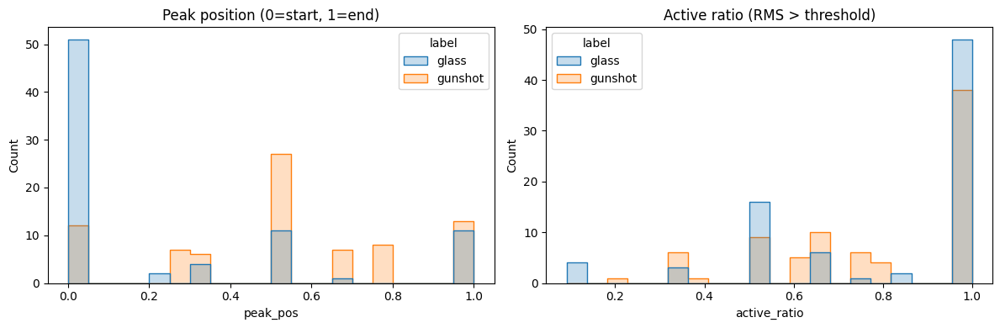

In [10]:
# Detailed energy/peak stats (uses global config values)

energy_detail = []
for lbl in ['glass', 'gunshot']:
    df_lbl = folded_df[folded_df['target_label'] == lbl]
    stats = compute_energy_detail(df_lbl)
    stats['label'] = lbl
    energy_detail.append(stats)
energy_detail = pd.concat(energy_detail, ignore_index=True)
print('Energy detail (mean/median/95%)')
display(energy_detail.groupby('label')[['duration', 'rms_max', 'peak_pos', 'active_ratio']].agg(['mean', 'median', _quantile95]))

fig, axes = plt.subplots(1, 2, figsize=(12, 4))
sns.histplot(data=energy_detail, x='peak_pos', hue='label', bins=20, ax=axes[0], element='step')
axes[0].set_title('Peak position (0=start, 1=end)')
sns.histplot(data=energy_detail, x='active_ratio', hue='label', bins=20, ax=axes[1], element='step')
axes[1].set_title('Active ratio (RMS > threshold)')
plt.tight_layout(); plt.show()


## Base window summary / 基础分窗统计
Generate aligned windows for glass & gunshot, count per clip. 对玻璃/枪声分窗，统计每clip窗口数。

In [11]:
records = []
labels_for_align = ['glass', 'gunshot']
all_labels = sorted(folded_df['target_label'].unique().tolist())
subset = folded_df[folded_df['target_label'].isin(all_labels)]
for _, row in subset.iterrows():
    wins = generate_aligned_windows(
        row,
        align_labels=labels_for_align,
        extra_shifts=EXTRA_SHIFTS,
        energy_threshold=ENERGY_THRESHOLD,
        peak_ratio_threshold=PEAK_RATIO_THRESHOLD,
        front_peak_ratio=FRONT_PEAK_RATIO,
        trim_silence_before=TRIM_SILENCE_BEFORE,
        trim_top_db=TRIM_TOP_DB,
        trim_min_keep_seconds=TRIM_MIN_KEEP_SECONDS,
        label_params=WINDOW_PARAMS,
    )
    records.append({
        'label': row['target_label'],
        'fold': row.get('fold_id', -1),
        'clip': Path(row['filepath']).stem,
        'n_windows': len(wins),
    })
base_df = pd.DataFrame(records)

# 简单键值统计：每类多少个窗口
if base_df.empty:
    print('No windows found')
else:
    total_windows = int(base_df['n_windows'].sum())
    print(f"Total clips: {len(base_df)}, total windows: {total_windows}")
    label_windows = base_df.groupby('label')['n_windows'].sum().reindex(all_labels, fill_value=0)
    print("\nWindows per label:")
    for lbl, cnt in label_windows.to_dict().items():
        print(f"  {lbl}: {int(cnt)}")

    if 'fold' in base_df.columns:
        fold_totals = base_df.pivot_table(index='fold', columns='label', values='n_windows', aggfunc='sum').fillna(0)
        print("\nWindows per fold x label (total windows):")
        display(fold_totals.T)


Total clips: 2471, total windows: 10366

Windows per label:
  airplane: 310
  breathing: 136
  brushing_teeth: 266
  can_opening: 49
  car_horn: 177
  cat: 109
  chainsaw: 258
  chirping_birds: 225
  church_bells: 301
  clapping: 256
  clock_alarm: 262
  clock_tick: 155
  coin: 20
  coughing: 63
  cow: 155
  crackling_fire: 252
  crickets: 315
  crow: 218
  crying_baby: 135
  dog: 86
  door_wood_creaks: 157
  door_wood_knock: 75
  drinking_sipping: 86
  engine: 321
  explode: 2
  facegun: 2
  fakegun: 6
  fan: 7
  fireworks: 97
  footsteps: 168
  frog: 196
  glass: 137
  glass-ai: 14
  gunshot: 457
  hand_saw: 215
  helicopter: 327
  hen: 134
  insects: 227
  keyboard_typing: 178
  laughing: 139
  mouse_click: 126
  music: 16
  pig: 150
  pouring_water: 166
  radio: 6
  rain: 347
  rooster: 73
  screaming: 18
  sea_waves: 285
  sheep: 202
  silent: 17
  siren: 294
  sneezing: 43
  snoring: 109
  talking: 34
  thunderstorm: 165
  toilet_flush: 213
  train: 320
  vacuum_cleaner: 331
  wa

fold,1,2,3,4,5
label,,,,,
airplane,60.0,69.0,61.0,61.0,59.0
breathing,26.0,29.0,24.0,31.0,26.0
brushing_teeth,64.0,49.0,47.0,52.0,54.0
can_opening,9.0,12.0,8.0,9.0,11.0
car_horn,23.0,36.0,39.0,31.0,48.0
...,...,...,...,...,...
train,65.0,63.0,69.0,58.0,65.0
vacuum_cleaner,59.0,67.0,69.0,69.0,67.0
washing_machine,63.0,64.0,70.0,70.0,72.0


## Window QA visualization / 分窗可视化QA
Plot waveform+RMS with kept window boundaries for one glass and one gunshot sample. 对玻璃/枪声各选一条，画波形+RMS并标出保留的窗口边界。


=== Sample 1: glass | esc50 | cache/data_resampled/data/esc50/audio/3-216280-A-39.wav
Full clip (5.00s)


,start_sec,end_sec,peak_ratio,peak_position,status,reason
0,NaN,NaN,NaN,NaN,info,len_raw=5.000s len_trim=0.240s lead_trim=0.288...
1,0.000000,0.288005,NaN,NaN,remove,silent_trim_head
2,0.528008,5.000000,NaN,NaN,remove,silent_trim_tail
3,0.288005,1.288005,1.0,0.031735,keep,pass


Length raw=5.00s after_trim=0.24s


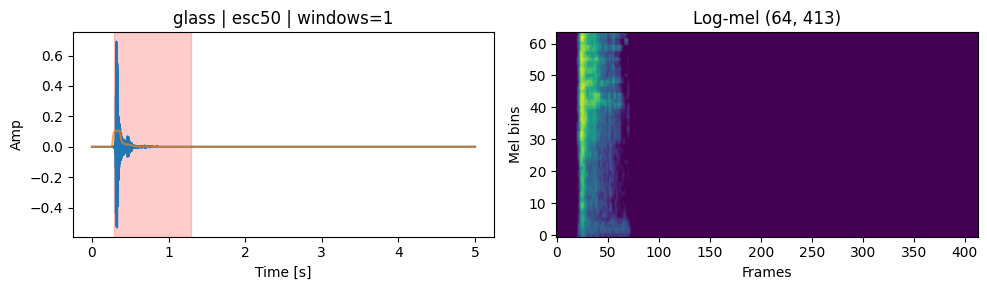

Play window 0: 0.29s - 1.29s


=== Sample 2: gunshot | gunshot_kaggle | cache/data_resampled/data/gunshot_kaggle/MG-42/7 (84).wav
Full clip (2.00s)


,start_sec,end_sec,peak_ratio,peak_position,status,reason
0,NaN,NaN,NaN,NaN,info,len_raw=2.000s len_trim=2.000s lead_trim=0.000...
1,0.000000,1.000000,1.000000,0.747902,keep,late_peak_keep_front_energy
2,0.499977,1.499977,1.000000,0.247926,keep,pass
3,0.999953,1.999953,0.810656,0.726058,skip,late_peak


Length raw=2.00s after_trim=1.88s


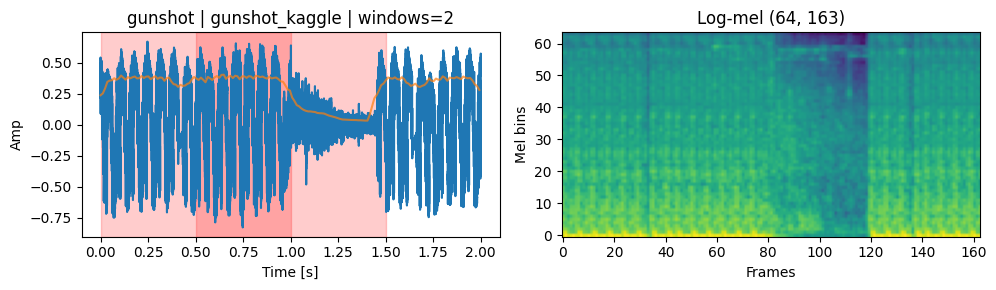

Play window 0: 0.00s - 1.00s


Play window 1: 0.50s - 1.50s


=== Sample 3: car_horn | esc50 | cache/data_resampled/data/esc50/audio/3-145577-A-43.wav
Full clip (5.00s)


,start_sec,end_sec,peak_ratio,peak_position,status,reason
0,NaN,NaN,None,None,info,len_raw=5.000s len_trim=0.864s lead_trim=0.000...
1,0.864014,5.0,None,None,remove,silent_trim_tail
2,0.000000,1.0,None,None,keep,pass


Length raw=5.00s after_trim=0.86s


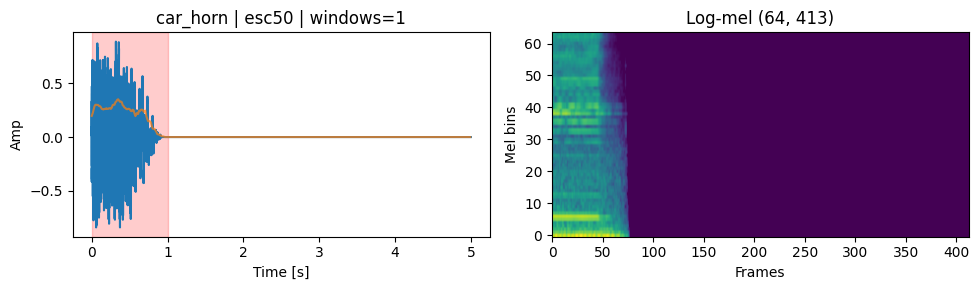

Play window 0: 0.00s - 1.00s


In [12]:
qa_seed = 7

# Window QA (combined viz + listening) / 分窗 QA（可视化+试听）
# Sample one glass, one gunshot, one background (if available); visualize windows and listen to kept windows.
samples_cfg = ['glass','gunshot', BACKGROUND_LABEL]
samples = []
for lbl in samples_cfg:
    subset = folded_df[folded_df['target_label']==lbl]
    if len(subset) == 0:
        continue
    samples.append(subset.sample(random_state=qa_seed).iloc[0])
if not any(s.get('target_label') == BACKGROUND_LABEL for s in samples):
    bg_pool = folded_df[~folded_df['target_label'].isin(['glass','gunshot'])]
    if len(bg_pool) > 0:
        samples.append(bg_pool.sample(random_state=qa_seed).iloc[0])
if len(samples) == 0:
    print('No samples available for QA')
else:
    for idx, row in enumerate(samples):
        print(f"=== Sample {idx+1}: {row.get('target_label','')} | {row.get('source','')} | {row.get('filepath','')}")
        y, sr = load_audio(row, sr=TARGET_SR)
        print(f"Full clip ({len(y)/sr:.2f}s)")
        display(Audio(y, rate=sr))
        # 记录窗口决策日志
        logs = []
        wins = generate_aligned_windows(
            row,
            align_labels=['glass','gunshot'],
            extra_shifts=EXTRA_SHIFTS,
            energy_threshold=ENERGY_THRESHOLD,
            peak_ratio_threshold=PEAK_RATIO_THRESHOLD,
            front_peak_ratio=FRONT_PEAK_RATIO,
            trim_silence_before=TRIM_SILENCE_BEFORE,
            trim_top_db=TRIM_TOP_DB,
            trim_min_keep_seconds=TRIM_MIN_KEEP_SECONDS,
            label_params=WINDOW_PARAMS,
            debug=True,
            debug_sink=logs,
        )
        # 打印日志表，便于查看被丢弃原因
        if logs:
            import pandas as pd
            display(pd.DataFrame(logs))
        # 记录修剪前后长度
        if TRIM_SILENCE_BEFORE:
            y_trim = trim_silence(y, sr, top_db=TRIM_TOP_DB, min_keep_seconds=TRIM_MIN_KEEP_SECONDS)
            print(f"Length raw={len(y)/sr:.2f}s after_trim={len(y_trim)/sr:.2f}s")
        hop_len = int(WINDOW_HOP * sr)
        win_len = int(WINDOW_SECONDS * sr)
        fig, axes = plt.subplots(1, 2, figsize=(10, 3))
        times = np.arange(len(y)) / sr
        axes[0].plot(times, y)
        axes[0].set_title(f"{row['target_label']} | {row['source']} | windows={len(wins)}")
        axes[0].set_xlabel('Time [s]')
        axes[0].set_ylabel('Amp')
        rms = librosa.feature.rms(y=y, frame_length=2048, hop_length=256)[0]
        rms_times = (np.arange(len(rms)) * 256) / sr
        axes[0].plot(rms_times, rms, alpha=0.7)
        # 使用日志中的 start_sec 标记被保留的窗口
        kept_starts = [l['start_sec'] for l in logs if l.get('status') == 'keep' and l.get('start_sec') is not None]
        for start_sec in kept_starts:
            axes[0].axvspan(start_sec, start_sec + WINDOW_SECONDS, color='red', alpha=0.2)
        mel = log_mel_spectrogram(y, sr, n_fft=HOP_LENGTH*4, hop_length=HOP_LENGTH, n_mels=N_MELS)
        axes[1].imshow(mel, aspect='auto', origin='lower')
        axes[1].set_title(f'Log-mel {mel.shape}')
        axes[1].set_xlabel('Frames')
        axes[1].set_ylabel('Mel bins')
        plt.tight_layout(); plt.show()
        for w_idx, w in enumerate(wins):
            start = kept_starts[w_idx] if w_idx < len(kept_starts) else w_idx * hop_len / sr
            end = start + WINDOW_SECONDS
            print(f"Play window {w_idx}: {start:.2f}s - {end:.2f}s")
            display(Audio(w, rate=sr))


## Play 10 event windows / 播放10个事件窗口
Play up to 10 kept windows (glass/gunshot) for quick QA. 播放最多10个保留窗口，便于快速听检。


In [13]:
clips = folded_df[folded_df['target_label'].isin(['glass','gunshot'])].sample(frac=1.0, random_state=SEED)
played = 0
for _, row in clips.iterrows():
    wins = generate_aligned_windows(
        row,
        align_labels=['glass','gunshot'],
        extra_shifts=EXTRA_SHIFTS,
        energy_threshold=ENERGY_THRESHOLD,
        peak_ratio_threshold=PEAK_RATIO_THRESHOLD,
        front_peak_ratio=FRONT_PEAK_RATIO,
        trim_silence_before=TRIM_SILENCE_BEFORE,
        trim_top_db=TRIM_TOP_DB,
        trim_min_keep_seconds=TRIM_MIN_KEEP_SECONDS,
        label_params=WINDOW_PARAMS,
    )
    for w_idx, w in enumerate(wins):
        print('{} | {} | window {}'.format(row['target_label'], Path(row['filepath']).stem, w_idx))
        display(Audio(w, rate=TARGET_SR))
        played += 1
        if played >= 10:
            break
    if played >= 10:
        break
if played == 0:
    print('No windows to play')

if not wins:
    print('No windows to inspect for shape')
else:
    mel = log_mel_spectrogram(wins[0], sr=TARGET_SR)
    print(f'log-mel shape: {mel.shape}; model input: (batch, 1, {mel.shape[0]}, {mel.shape[1]})')


gunshot | 4 (57) | window 0


gunshot | 4 (57) | window 1


gunshot | 6 (66) | window 0


gunshot | 6 (66) | window 1


gunshot | 9 (18) | window 0


gunshot | 8 (75) | window 0


gunshot | 8 (75) | window 1


glass | glass_glass-shatter-3-100155 | window 0


gunshot | 9 (4) | window 0


glass | glass_break-1-80963 | window 0


log-mel shape: (64, 80); model input: (batch, 1, 64, 80)


## 整合原始window数据

In [14]:
# Build window-level dataframe (one row per window)
window_records = []
labels_for_align = TARGET_LABELS  # 正类对齐峰值，其余走背景逻辑
for _, row in folded_df.iterrows():
    wins = generate_aligned_windows(
        row,
        align_labels=labels_for_align,
        extra_shifts=EXTRA_SHIFTS,
        energy_threshold=ENERGY_THRESHOLD,
        peak_ratio_threshold=PEAK_RATIO_THRESHOLD,
        front_peak_ratio=FRONT_PEAK_RATIO,
        trim_silence_before=TRIM_SILENCE_BEFORE,
        trim_top_db=TRIM_TOP_DB,
        trim_min_keep_seconds=TRIM_MIN_KEEP_SECONDS,
        label_params=WINDOW_PARAMS,
    )
    base_label = row.get('canonical_label', row.get('target_label', 'unknown'))
    mapped_label = base_label if base_label in TARGET_LABELS else BACKGROUND_LABEL
    clip_id = Path(row['filepath']).stem
    for w_idx, w in enumerate(wins):
        start_sec = w_idx * WINDOW_HOP
        end_sec = start_sec + WINDOW_SECONDS
        window_records.append({
            'clip_id': clip_id,
            'window_id': f"w{w_idx}",
            'fold_id': row.get('fold_id', -1),
            'source': row.get('source', ''),
            'orig_label': base_label,
            'target_label': mapped_label,
            'start_sec': start_sec,
            'end_sec': end_sec,
            'length_sec': WINDOW_SECONDS,
            'filepath': row.get('filepath'),
            'raw_filepath': row.get('raw_filepath'),
        })

window_df = pd.DataFrame(window_records)
print(f"Total windows: {len(window_df)}")
label_totals = window_df['target_label'].value_counts().to_dict()
print("Windows per label (total):")
for k, v in label_totals.items():
    print(f"  {k}: {v}")

if 'fold_id' in window_df.columns:
    print("\nFold x label (total windows):")
    pivot = window_df.pivot_table(index='fold_id', columns='target_label', values='window_id', aggfunc='count').fillna(0)
    print(pivot.to_string())


display(window_df[:5])


Total windows: 10366
Windows per label (total):
  background: 9772
  gunshot: 457
  glass: 137

Fold x label (total windows):
target_label  background  glass  gunshot
fold_id                                 
1                   1951     24       87
2                   1947     23       88
3                   1882     41      102
4                   1978     25       92
5                   2014     24       88


,clip_id,window_id,fold_id,source,orig_label,target_label,start_sec,end_sec,length_sec,filepath,raw_filepath
0,5-215445-A-47,w0,1,esc50,airplane,background,0.0,1.0,1.0,cache/data_resampled/data/esc50/audio/5-215445...,data/esc50/audio/5-215445-A-47.wav
1,5-215445-A-47,w1,1,esc50,airplane,background,0.5,1.5,1.0,cache/data_resampled/data/esc50/audio/5-215445...,data/esc50/audio/5-215445-A-47.wav
2,5-215445-A-47,w2,1,esc50,airplane,background,1.0,2.0,1.0,cache/data_resampled/data/esc50/audio/5-215445...,data/esc50/audio/5-215445-A-47.wav
3,5-215445-A-47,w3,1,esc50,airplane,background,1.5,2.5,1.0,cache/data_resampled/data/esc50/audio/5-215445...,data/esc50/audio/5-215445-A-47.wav
4,5-215445-A-47,w4,1,esc50,airplane,background,2.0,3.0,1.0,cache/data_resampled/data/esc50/audio/5-215445...,data/esc50/audio/5-215445-A-47.wav


## Augment plan & cache dirs / 增强计划与缓存目录
设定 pipeline、对齐标签、Smoke/Full 输出目录。

In [15]:
# ALIGN_LABELS = CACHE_ALIGN_LABELS
SMOKE_CACHE_DIR = CACHE_MEL64 / 'mel64_smoke_multi'
FULL_CACHE_DIR = CACHE_MEL64 / 'mel64_multi'
SMOKE_COUNTS = {'glass': 10, 'gunshot': 10, 'background': 20}
print('Smoke dir:', SMOKE_CACHE_DIR)
print('Full dir:', FULL_CACHE_DIR)


Smoke dir: /workspace/cache/mel64/mel64_smoke_multi
Full dir: /workspace/cache/mel64/mel64_multi


## 选出 target window，并使用数据增强扩充

In [16]:
import re

PIPELINE_PLAN_GLASS = list(PIPELINE_REGISTRY.keys())
PIPELINE_PLAN_GUNSHOT = [
    k for k in PIPELINE_REGISTRY.keys()
    if k not in ["reverb_mix_filter_gain", "stretch_mix_filter_gain", "reverb_filter_gain"]  # 可按需调整
]

rng = np.random.default_rng(SEED)
aug_records = []

def parse_weapon(extra: str):
    if not isinstance(extra, str):
        return "unknown"
    m = re.search(r"weapon_id=([^,;]+)", extra)
    return m.group(1).strip() if m else "unknown"

# 如果已有 bg_pool / TARGET_SR
def sample_bg_chunk(length):
    if bg_pool.empty:
        return None
    row_bg = bg_pool.sample(random_state=SEED).iloc[0]
    y_bg, _ = load_audio(row_bg, sr=TARGET_SR)
    if len(y_bg) < length:
        y_bg = np.pad(y_bg, (0, length - len(y_bg)))
    start = rng.integers(0, max(1, len(y_bg) - length + 1))
    return y_bg[start:start+length]
    

In [17]:
# Glass / Gun fold rebalance before tasks_pos (clip-level, window-count driven)
import pandas as pd
from pathlib import Path
from src.folds import rebalance_folds_by_windows

REBALANCE_GLASS = True
REBALANCE_GUN = True
TOL_RATIO = 0.0  # enforce tight balance
WIN_CACHE = {}


def _count_windows_for_label(label, folded_df):
    records = []
    df = folded_df[folded_df['canonical_label']==label]
    for _, row in df.iterrows():
        hop_override = WINDOW_HOP_OVERRIDE.get(label)
        wins = generate_aligned_windows(
            row,
            align_labels=TARGET_LABELS,
            extra_shifts=EXTRA_SHIFTS,
            energy_threshold=ENERGY_THRESHOLD,
            peak_ratio_threshold=PEAK_RATIO_THRESHOLD,
            front_peak_ratio=FRONT_PEAK_RATIO,
            trim_silence_before=TRIM_SILENCE_BEFORE,
            trim_top_db=TRIM_TOP_DB,
            trim_min_keep_seconds=TRIM_MIN_KEEP_SECONDS,
            label_params=WINDOW_PARAMS,
            window_hop=hop_override,
        )
        weapon = parse_weapon(row.get("extra_meta", "")) if label=="gunshot" else None
        for w_idx, w in enumerate(wins):
            rec = {
                "clip_id": Path(row["filepath"]).stem,
                "fold_id": row["fold_id"],
                "target_label": label,
                "window_id": f"w{w_idx}",
                "audio": w,
                "row": row,
            }
            if weapon is not None:
                rec["weapon"] = weapon
            records.append(rec)
    return records

if 'folded_df' not in globals():
    print('folded_df not found; skip rebalance')
else:
    for label, do_reb in [('glass', REBALANCE_GLASS), ('gunshot', REBALANCE_GUN)]:
        if not do_reb:
            print(f"Skip rebalance for {label}")
            continue
        records = _count_windows_for_label(label, folded_df)
        if not records:
            print(f'No {label} windows; skip rebalance')
            continue
        win_tmp = pd.DataFrame([{k:v for k,v in rec.items() if k!='audio' and k!='row'} for rec in records])
        print(f'{label} windows before rebalance (per fold):')
        print(win_tmp.groupby('fold_id').size())
        sub_label = 'weapon' if label=='gunshot' and 'weapon' in win_tmp.columns else None
        balanced, moves = rebalance_folds_by_windows(
            win_tmp,
            label_col='target_label',
            sub_label_col=sub_label,
            preserve_label_presence=True,
            preserve_sub_label_presence=True,
            tolerance_ratio=TOL_RATIO,
        )
        if moves:
            print(f"Rebalanced {label} (moved {len(moves)} clips):")
            for m in moves:
                print(f"clip {m['clip_id']} : fold {m['from']} -> {m['to']} | windows={m['n_windows']}")
            move_map = {m['clip_id']: m['to'] for m in moves}
            mask = folded_df['canonical_label']==label
            folded_df.loc[mask, 'fold_id'] = folded_df.loc[mask, 'filepath'].map(
                lambda p: move_map.get(Path(str(p)).stem, None)
            ).fillna(folded_df.loc[mask, 'fold_id']).astype(int)
            # update cached records
            for rec in records:
                if rec['clip_id'] in move_map:
                    rec['fold_id'] = move_map[rec['clip_id']]
            win_tmp['fold_id'] = win_tmp['clip_id'].map(move_map).fillna(win_tmp['fold_id']).astype(int)
            print(f'After rebalance ({label}) per fold:')
            print(win_tmp.groupby('fold_id').size())
        else:
            print(f'No {label} rebalance performed (within tolerance).')
        WIN_CACHE[label] = records


glass windows before rebalance (per fold):
fold_id
1    30
2    28
3    61
4    28
5    26
dtype: int64
Rebalanced glass (moved 6 clips):
clip 4-204777-A-39 : fold 3 -> 5 | windows=16
clip 4-204777-C-39 : fold 3 -> 2 | windows=8
clip glass_break-5978 : fold 5 -> 4 | windows=3
clip glass_breaking-151256 : fold 5 -> 1 | windows=2
clip 2-173618-A-39 : fold 3 -> 4 | windows=3
clip 2-106881-A-39 : fold 5 -> 1 | windows=1
After rebalance (glass) per fold:
fold_id
1    33
2    36
3    34
4    34
5    36
dtype: int64
gunshot windows before rebalance (per fold):
fold_id
1     87
2     88
3    102
4     92
5     88
dtype: int64
Rebalanced gunshot (moved 3 clips):
clip 1 (18) : fold 3 -> 1 | windows=3
clip 1 (20) : fold 3 -> 2 | windows=3
clip 1 (52) : fold 3 -> 5 | windows=3
After rebalance (gunshot) per fold:
fold_id
1    90
2    91
3    93
4    92
5    91
dtype: int64


In [18]:
tasks_pos = []  # 每个元素保存本折本类的 win_pool、剩余额度等

for lab, target in TARGET_PER_FOLD.items():
    for fold, group in folded_df[folded_df["canonical_label"] == lab].groupby("fold_id"):
        cache_list = WIN_CACHE.get(lab) if 'WIN_CACHE' in globals() else None
        win_pool = []
        if cache_list:
            for rec in cache_list:
                if rec['fold_id'] != fold:
                    continue
                w = rec['audio']
                row = rec['row']
                weapon = rec.get('weapon')
                w_idx = int(rec['window_id'].lstrip('w'))
                win_pool.append((rec['clip_id'], w_idx, w, row, weapon))
        else:
            hop_override = WINDOW_HOP_OVERRIDE.get(lab)
            for _, row in group.iterrows():
                wins = generate_aligned_windows(
                    row,
                    align_labels=TARGET_LABELS,
                    extra_shifts=EXTRA_SHIFTS,
                    energy_threshold=ENERGY_THRESHOLD,
                    peak_ratio_threshold=PEAK_RATIO_THRESHOLD,
                    front_peak_ratio=FRONT_PEAK_RATIO,
                    trim_silence_before=TRIM_SILENCE_BEFORE,
                    trim_top_db=TRIM_TOP_DB,
                    trim_min_keep_seconds=TRIM_MIN_KEEP_SECONDS,
                    label_params=WINDOW_PARAMS,
                    window_hop=hop_override,
                )
                clip_id = Path(row["filepath"]).stem
                weapon = parse_weapon(row.get("extra_meta", "")) if lab == "gunshot" else None
                for w_idx, w in enumerate(wins):
                    win_pool.append((clip_id, w_idx, w, row, weapon))

        if not win_pool:
            continue

        # base 全写，不占配额
        for clip_id, w_idx, w, row, _weapon in win_pool:
            aug_records.append({
                "clip_id": clip_id,
                "window_id": f"{clip_id}_w{w_idx}",
                "fold_id": fold,
                "source": row.get("source",""),
                "original_label": lab,
                "target_label": lab,
                "pipeline": "base",
                "copy": 0,
                "length_sec": len(w) / TARGET_SR,
                "audio": w,
            })

        remaining = max(target - len(win_pool), 0)
        plan_names = PIPELINE_PLAN_GUNSHOT if lab == "gunshot" else PIPELINE_PLAN_GLASS
        tasks_pos.append({
            "lab": lab,
            "fold": fold,
            "win_pool": win_pool,
            "remaining": remaining,
            "plan_names": plan_names,
        })

# 查看 tasks_pos 摘要
summary = []
for t in tasks_pos:
    summary.append({
        "lab": t["lab"],
        "fold": t["fold"],
        "win_pool": len(t["win_pool"]),
        "remaining": t["remaining"],
        "plan_names": t["plan_names"],
        "device_plans": DEVICE_PLANS,
    })

with pd.option_context("display.max_colwidth", None):
    display(pd.DataFrame(summary))



,lab,fold,win_pool,remaining,plan_names,device_plans
0,glass,1,33,267,"[stretch_gain_shift, reverb_gain_shift, mix_gain_shift, filter_gain_shift, mix_filter_gain_shift, stretch_mix_gain_shift, stretch_filter_gain_shift, reverb_mix_gain_shift, reverb_filter_gain_shift, stretch_mix_filter_gain_shift, reverb_mix_filter_gain_shift]","[none, eq, band, rir, codec, compress, codec_compress]"
1,glass,2,36,264,"[stretch_gain_shift, reverb_gain_shift, mix_gain_shift, filter_gain_shift, mix_filter_gain_shift, stretch_mix_gain_shift, stretch_filter_gain_shift, reverb_mix_gain_shift, reverb_filter_gain_shift, stretch_mix_filter_gain_shift, reverb_mix_filter_gain_shift]","[none, eq, band, rir, codec, compress, codec_compress]"
2,glass,3,34,266,"[stretch_gain_shift, reverb_gain_shift, mix_gain_shift, filter_gain_shift, mix_filter_gain_shift, stretch_mix_gain_shift, stretch_filter_gain_shift, reverb_mix_gain_shift, reverb_filter_gain_shift, stretch_mix_filter_gain_shift, reverb_mix_filter_gain_shift]","[none, eq, band, rir, codec, compress, codec_compress]"
3,glass,4,34,266,"[stretch_gain_shift, reverb_gain_shift, mix_gain_shift, filter_gain_shift, mix_filter_gain_shift, stretch_mix_gain_shift, stretch_filter_gain_shift, reverb_mix_gain_shift, reverb_filter_gain_shift, stretch_mix_filter_gain_shift, reverb_mix_filter_gain_shift]","[none, eq, band, rir, codec, compress, codec_compress]"
4,glass,5,36,264,"[stretch_gain_shift, reverb_gain_shift, mix_gain_shift, filter_gain_shift, mix_filter_gain_shift, stretch_mix_gain_shift, stretch_filter_gain_shift, reverb_mix_gain_shift, reverb_filter_gain_shift, stretch_mix_filter_gain_shift, reverb_mix_filter_gain_shift]","[none, eq, band, rir, codec, compress, codec_compress]"
5,gunshot,1,90,210,"[stretch_gain_shift, reverb_gain_shift, mix_gain_shift, filter_gain_shift, mix_filter_gain_shift, stretch_mix_gain_shift, stretch_filter_gain_shift, reverb_mix_gain_shift, reverb_filter_gain_shift, stretch_mix_filter_gain_shift, reverb_mix_filter_gain_shift]","[none, eq, band, rir, codec, compress, codec_compress]"
6,gunshot,2,91,209,"[stretch_gain_shift, reverb_gain_shift, mix_gain_shift, filter_gain_shift, mix_filter_gain_shift, stretch_mix_gain_shift, stretch_filter_gain_shift, reverb_mix_gain_shift, reverb_filter_gain_shift, stretch_mix_filter_gain_shift, reverb_mix_filter_gain_shift]","[none, eq, band, rir, codec, compress, codec_compress]"
7,gunshot,3,93,207,"[stretch_gain_shift, reverb_gain_shift, mix_gain_shift, filter_gain_shift, mix_filter_gain_shift, stretch_mix_gain_shift, stretch_filter_gain_shift, reverb_mix_gain_shift, reverb_filter_gain_shift, stretch_mix_filter_gain_shift, reverb_mix_filter_gain_shift]","[none, eq, band, rir, codec, compress, codec_compress]"
8,gunshot,4,92,208,"[stretch_gain_shift, reverb_gain_shift, mix_gain_shift, filter_gain_shift, mix_filter_gain_shift, stretch_mix_gain_shift, stretch_filter_gain_shift, reverb_mix_gain_shift, reverb_filter_gain_shift, stretch_mix_filter_gain_shift, reverb_mix_filter_gain_shift]","[none, eq, band, rir, codec, compress, codec_compress]"
9,gunshot,5,91,209,"[stretch_gain_shift, reverb_gain_shift, mix_gain_shift, filter_gain_shift, mix_filter_gain_shift, stretch_mix_gain_shift, stretch_filter_gain_shift, reverb_mix_gain_shift, reverb_filter_gain_shift, stretch_mix_filter_gain_shift, reverb_mix_filter_gain_shift]","[none, eq, band, rir, codec, compress, codec_compress]"


[done] fold 1 lab glass: base=33, aug_added=267 / target 267
[done] fold 2 lab glass: base=36, aug_added=264 / target 264
[done] fold 3 lab glass: base=34, aug_added=266 / target 266
[done] fold 4 lab glass: base=34, aug_added=266 / target 266
[done] fold 5 lab glass: base=36, aug_added=264 / target 264
[done] fold 1 lab gunshot: base=90, aug_added=210 / target 210
[done] fold 2 lab gunshot: base=91, aug_added=209 / target 209
[done] fold 3 lab gunshot: base=93, aug_added=207 / target 207
[done] fold 4 lab gunshot: base=92, aug_added=208 / target 208
[done] fold 5 lab gunshot: base=91, aug_added=209 / target 209


,clip_id,window_id,fold_id,source,original_label,target_label,pipeline,copy,length_sec,audio,device
0,glass_breaking-glass-2-86555,glass_breaking-glass-2-86555_w0,1,sound_extra,glass,glass,base,0,1.0,"[-0.00061035156, 0.00030517578, 0.0, 0.0001831...",NaN
1,glass_shattering-chandelier-38391,glass_shattering-chandelier-38391_w0,1,sound_extra,glass,glass,base,0,1.0,"[-0.00018310547, -0.00018310547, 0.00033569336...",NaN
2,glass_shattering-chandelier-38391,glass_shattering-chandelier-38391_w1,1,sound_extra,glass,glass,base,0,1.0,"[-0.5987854, -0.59402466, 0.23687744, -0.01562...",NaN
3,glass_breaking-glass-88411,glass_breaking-glass-88411_w0,1,sound_extra,glass,glass,base,0,1.0,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",NaN
4,glass_541601__matt_ratz__shattering-chandelier,glass_541601__matt_ratz__shattering-chandelier_w0,1,sound_extra,glass,glass,base,0,1.0,"[-0.00012207031, -3.0517578e-05, 0.00036621094...",NaN


Windows per fold x target_label x pipeline (with totals):
                                                             1    2    3    4    5  total
target_label pipeline                                                                    
glass        band+filter_gain_shift                          4    1    6    3    2     16
             band+mix_filter_gain_shift                      2    3    5    2    4     16
             band+mix_gain_shift                             3    2    5    3    3     16
             band+reverb_filter_gain_shift                   3    3    6    2    5     19
             band+reverb_gain_shift                          3    3    4    3    2     15
             band+reverb_mix_filter_gain_shift               3    3    5    2    2     15
             band+reverb_mix_gain_shift                      2    3    8    3    4     20
             band+stretch_filter_gain_shift                  3    1   10    2    3     19
             band+stretch_gain_shift      

fold_id,1,2,3,4,5
weapon,,,,,
AK-12,34,33,35,33,32
AK-47,39,32,41,36,37
IMI Desert Eagle,34,33,33,32,31
M16,29,31,36,31,34
M249,35,36,36,37,33
M4,32,33,33,30,33
MG-42,34,35,37,38,32
MP5,31,33,31,32,32
Zastava M92,29,29,31,31,31


Device x fold (positives, counts):


fold_id,1,2,3,4,5
device,,,,,
band,63,58,99,59,61
codec,63,59,99,62,56
codec_compress,64,57,99,60,55
compress,65,59,98,61,55
eq,65,60,97,61,57
none,64,59,98,61,58
rir,65,59,95,62,57


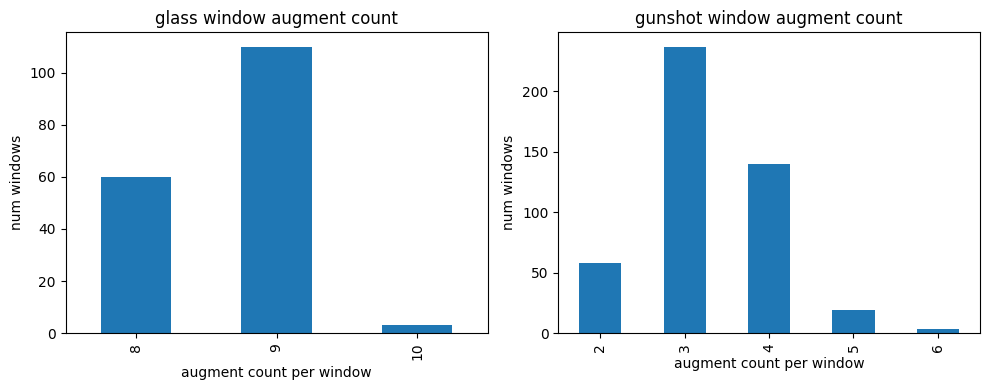

In [19]:
# Positives augmentation with balanced coverage (per window/pipeline/device, gun by weapon)
aug_records = list(globals().get("aug_records", []))

# Helper cycles
from itertools import cycle

def _pipeline_cycle(pipelines, rng):
    pipelines = list(pipelines)
    rng.shuffle(pipelines)
    return cycle(pipelines)

def _device_cycle(devices, rng):
    devices = list(devices)
    rng.shuffle(devices)
    return cycle(devices)


def _schedule_grouped(win_pool, plan_names, device_plans, quota, max_per_window):
    """Round-robin across groups (weapon), ensure per-window cap and broad coverage."""
    rng = np.random.default_rng(SEED)
    # group by weapon
    groups = {}
    for item in win_pool:
        weapon = item[4] or "unknown"
        groups.setdefault(weapon, []).append(item)
    for g in groups:
        rng.shuffle(groups[g])
    counts = {(cid, widx): 0 for cid, widx, *_ in win_pool}
    out = []
    pipe_c = _pipeline_cycle(plan_names, rng)
    dev_c = _device_cycle(device_plans, rng)
    round_idx = 0
    while len(out) < quota and round_idx < max_per_window:
        progressed = False
        for weapon in sorted(groups.keys()):
            pool = groups[weapon]
            if not pool:
                continue
            # pick item in round-robin within group
            item = pool[round_idx % len(pool)]
            cid, w_idx, w, row, _weapon = item
            key = (cid, w_idx)
            if counts[key] >= max_per_window:
                pass
            pipeline = next(pipe_c)
            device_name = next(dev_c)
            w_dev = run_device_pipeline(w, device_name, TARGET_SR)
            bg = sample_bg_chunk(len(w_dev)) if "mix" in PIPELINE_REGISTRY[pipeline] else None
            aug = run_pipeline(w_dev, pipeline, background=bg)
            pipeline_tag = pipeline if device_name == "none" else f"{device_name}+{pipeline}"
            out.append({
                "clip_id": cid,
                "window_id": f"{cid}_w{w_idx}",
                "fold_id": int(row.get("fold_id", -1)),
                "source": row.get("source", ""),
                "original_label": row.get("target_label", ""),
                "target_label": row.get("target_label", ""),
                "pipeline": pipeline_tag,
                "device": device_name,
                "copy": 0,
                "length_sec": len(aug.audio) / TARGET_SR,
                "audio": aug.audio,
            })
            counts[key] += 1
            progressed = True
            if len(out) >= quota:
                break
        if not progressed:
            break
        round_idx += 1
    return out


def _schedule_simple(win_pool, plan_names, device_plans, quota, max_per_window):
    rng = np.random.default_rng(SEED)
    win_pool = list(win_pool)
    rng.shuffle(win_pool)
    counts = {(cid, widx): 0 for cid, widx, *_ in win_pool}
    out = []
    pipe_c = _pipeline_cycle(plan_names, rng)
    dev_c = _device_cycle(device_plans, rng)
    round_idx = 0
    while len(out) < quota and round_idx < max_per_window:
        progressed = False
        for item in win_pool:
            cid, w_idx, w, row, _weapon = item
            key = (cid, w_idx)
            if counts[key] >= max_per_window:
                pass
            pipeline = next(pipe_c)
            device_name = next(dev_c)
            w_dev = run_device_pipeline(w, device_name, TARGET_SR)
            bg = sample_bg_chunk(len(w_dev)) if "mix" in PIPELINE_REGISTRY[pipeline] else None
            aug = run_pipeline(w_dev, pipeline, background=bg)
            pipeline_tag = pipeline if device_name == "none" else f"{device_name}+{pipeline}"
            out.append({
                "clip_id": cid,
                "window_id": f"{cid}_w{w_idx}",
                "fold_id": int(row.get("fold_id", -1)),
                "source": row.get("source", ""),
                "original_label": row.get("target_label", ""),
                "target_label": row.get("target_label", ""),
                "pipeline": pipeline_tag,
                "device": device_name,
                "copy": 0,
                "length_sec": len(aug.audio) / TARGET_SR,
                "audio": aug.audio,
            })
            counts[key] += 1
            progressed = True
            if len(out) >= quota:
                break
        if not progressed:
            break
        round_idx += 1
    return out

aug_records = list(globals().get("aug_records", []))
PROGRESS_STEP = 200
MAX_PER_WINDOW = 10**9  # disable cap, prioritize quota coverage

for task in tasks_pos:
    lab = task["lab"]; fold = task["fold"]; win_pool = task["win_pool"]
    remaining = task["remaining"]; plan_names = task["plan_names"]
    if not win_pool:
        print(f"[warn] fold {fold} lab {lab} win_pool empty, skip.")
        continue

    # base 已写入 aug_records 在前一单元（tasks_pos 构建时）。仅做增强。
    if remaining <= 0 or not plan_names:
        print(f"[info] fold {fold} lab {lab}: remaining=0 or no plan, only base written.")
        continue

    max_aug_quota = remaining
    if lab == "gunshot":
        aug_list = _schedule_grouped(win_pool, plan_names, DEVICE_PLANS, max_aug_quota, MAX_PER_WINDOW)
    else:
        aug_list = _schedule_simple(win_pool, plan_names, DEVICE_PLANS, max_aug_quota, MAX_PER_WINDOW)

    aug_records.extend(aug_list)
    print(f"[done] fold {fold} lab {lab}: base={len(win_pool)}, aug_added={len(aug_list)} / target {max_aug_quota}")

aug_df = pd.DataFrame(aug_records)
display(aug_df[:5])

print("Windows per fold x target_label x pipeline (with totals):")
pivot = aug_df.pivot_table(
    index="fold_id",
    columns=["target_label", "pipeline"],
    values="window_id",
    aggfunc="count"
).fillna(0).astype(int)
pivot["total"] = pivot.sum(axis=1)
total_row = pivot.sum(axis=0).to_frame().T; total_row.index = ["total"]
pivot_with_totals = pd.concat([pivot, total_row])
print(pivot_with_totals.T.to_string())

# weapon 映射与统计
gun_aug = aug_df[aug_df["target_label"] == "gunshot"].copy()
if not gun_aug.empty:
    weapon_map = {
        Path(row["filepath"]).stem: parse_weapon(row.get("extra_meta", ""))
        for _, row in folded_df[folded_df["canonical_label"] == "gunshot"].iterrows()
    }
    gun_aug["weapon"] = gun_aug.apply(
        lambda r: weapon_map.get(r["clip_id"], "unknown"), axis=1,
    )
    print("Weapon x fold (augmented windows, counts):")
    weapon_fold_win = gun_aug.pivot_table(
        index="weapon",
        columns="fold_id",
        values="window_id",
        aggfunc="count",
        fill_value=0
    ).astype(int)
    display(weapon_fold_win)

print("Device x fold (positives, counts):")
pivot_dev = aug_df.pivot_table(
    index="device",
    columns="fold_id",
    values="window_id",
    aggfunc="count",
    fill_value=0
).astype(int)
display(pivot_dev)


# Per-window augmentation counts histogram
import matplotlib.pyplot as plt

# Build base window id set per class from base records (already in aug_records at base stage)
# Derive counts from aug_df (excluding base) per class
hist_data = {}
for cls in ['glass','gunshot']:
    cls_augs = aug_df[aug_df['target_label']==cls]
    # base rows are also in aug_df? If not, counts default 0
    counts = cls_augs.groupby(['clip_id','window_id']).size()
    hist_data[cls] = counts.value_counts().sort_index()

# Background histogram from bg_df
if 'bg_df' in globals():
    bg_counts = bg_df.groupby(['clip_id','window_id']).size()
    hist_data['background'] = bg_counts.value_counts().sort_index()

fig, axes = plt.subplots(1, len(hist_data), figsize=(5*len(hist_data),4))
if len(hist_data)==1:
    axes=[axes]
for ax,(cls,hist) in zip(axes, hist_data.items()):
    hist.plot(kind='bar', ax=ax)
    ax.set_title(f'{cls} window augment count')
    ax.set_xlabel('augment count per window')
    ax.set_ylabel('num windows')
plt.tight_layout()
plt.show()


## 均匀抽样选出 background window

In [20]:
plan_names = list(PIPELINE_REGISTRY.keys())
rng = np.random.default_rng(SEED)
bg_aug_records = []

SILENT_PER_FOLD = 20
SILENT_DB_RANGE = (-45.0, -35.0)
SILENT_PIPELINE = "silent_atten"

def _rms(y):
    return float(np.sqrt(np.mean(y**2) + 1e-12))

def _scale_to_db(y, target_db):
    cur = _rms(y)
    if cur <= 1e-9:
        return y.astype(np.float32, copy=False)
    target = 10 ** (target_db / 20.0)
    scale = target / cur
    return (y * scale).astype(np.float32, copy=False)
    

In [21]:
tasks_bg = []  # 保存每折的 win_pool、silent_count、remaining_target 等

for fold, group in folded_df[~folded_df['canonical_label'].isin(TARGET_LABELS)].groupby('fold_id'):
    win_by_label = {}
    for _, row in group.iterrows():
        wins = generate_aligned_windows(
            row,
            align_labels=TARGET_LABELS,
            extra_shifts=EXTRA_SHIFTS,
            energy_threshold=ENERGY_THRESHOLD,
            peak_ratio_threshold=PEAK_RATIO_THRESHOLD,
            front_peak_ratio=FRONT_PEAK_RATIO,
            trim_silence_before=TRIM_SILENCE_BEFORE,
            trim_top_db=TRIM_TOP_DB,
            trim_min_keep_seconds=TRIM_MIN_KEEP_SECONDS,
            label_params=WINDOW_PARAMS,
        )
        clip_id = Path(row['filepath']).stem
        orig_label = row.get('canonical_label', row.get('target_label', 'unknown'))
        for w_idx, w in enumerate(wins):
            win_by_label.setdefault(orig_label, []).append((clip_id, w_idx, w, row, orig_label))

    if not win_by_label:
        continue

    for lab in win_by_label:
        rng.shuffle(win_by_label[lab])

    labels = sorted(win_by_label.keys()); n_labels = len(labels)

    # 1) silent 配额
    silent_count = 0
    while silent_count < SILENT_PER_FOLD:
        progressed = False
        for lab in labels:
            if silent_count >= SILENT_PER_FOLD:
                break
            pool = win_by_label[lab]
            if not pool:
                continue
            clip_id, w_idx, w, row, orig_label = pool[0]
            win_by_label[lab] = pool[1:]
            y_silent = _scale_to_db(w, rng.uniform(*SILENT_DB_RANGE))
            bg_aug_records.append({
                'clip_id': clip_id,
                'window_id': f"{clip_id}_w{w_idx}_silent_{silent_count}",
                'fold_id': fold,
                'source': row.get('source',''),
                'original_label': 'silent',
                'target_label': BACKGROUND_LABEL,
                'pipeline': SILENT_PIPELINE,
                'copy': 0,
                'length_sec': len(y_silent)/TARGET_SR,
                'audio': y_silent,
                'filepath': row.get('filepath', row.get('raw_filepath', '')),
                'raw_filepath': row.get('raw_filepath', row.get('filepath', '')),
            })
            silent_count += 1; progressed = True
        if not progressed:
            break

    remaining_target = max(0, TARGET_BG_PER_FOLD - silent_count)
    base_quota = remaining_target // n_labels if n_labels > 0 else 0
    remainder = remaining_target % n_labels if n_labels > 0 else 0
    count = 0

    # 基准 base 分配
    for lab in labels:
        pool = win_by_label[lab]
        take_n = min(base_quota, len(pool))
        for i in range(take_n):
            clip_id, w_idx, w, row, orig_label = pool[i]
            bg_aug_records.append({
                'clip_id': clip_id,
                'window_id': f"{clip_id}_w{w_idx}",
                'fold_id': fold,
                'source': row.get('source',''),
                'original_label': orig_label,
                'target_label': BACKGROUND_LABEL,
                'pipeline': 'base',
                'copy': 0,
                'length_sec': len(w)/TARGET_SR,
                'audio': w,
            })
            count += 1
        win_by_label[lab] = pool[take_n:]

    tasks_bg.append({
        "fold": fold,
        "win_by_label": win_by_label,
        "labels": labels,
        "remainder": remainder,
        "count": count,
        "remaining_target": remaining_target,
        "device_plans": DEVICE_PLANS,  

    })


summary_bg = []
for t in tasks_bg:
    summary_bg.append({
        "fold": t["fold"],
        "labels": t["labels"],
        "n_labels": len(t["labels"]),
        "win_total": sum(len(v) for v in t["win_by_label"].values()),
        "remaining_target": t["remaining_target"],
        "count_base": t["count"],
        "remainder": t["remainder"],
    })

display(pd.DataFrame(summary_bg))


,fold,labels,n_labels,win_total,remaining_target,count_base,remainder
0,1,"[airplane, breathing, brushing_teeth, can_open...",60,1500,480,431,0
1,2,"[airplane, breathing, brushing_teeth, can_open...",58,1507,480,420,16
2,3,"[airplane, breathing, brushing_teeth, can_open...",57,1447,480,415,24
3,4,"[airplane, breathing, brushing_teeth, can_open...",57,1542,480,416,24
4,5,"[airplane, breathing, brushing_teeth, can_open...",57,1580,480,414,24


In [22]:
# Background augmentation with balanced coverage (label x window x pipeline)
PROGRESS_STEP = 200
MAX_BG_PER_WINDOW = 10**9
# Preserve previously written silent/base records
bg_aug_records = list(globals().get('bg_aug_records', []))

from itertools import cycle

def _schedule_bg(win_by_label, pipelines, device_plans, quota_per_fold, max_per_window):
    rng = np.random.default_rng(SEED)
    counts = {}
    items = []
    for lab, pool in win_by_label.items():
        rng.shuffle(pool)
        for item in pool:
            cid, w_idx, w, row, orig_label = item
            key = (cid, w_idx)
            counts[key] = 0
            items.append((lab, cid, w_idx, w, row, orig_label))
    if not items or quota_per_fold <= 0:
        return []
    pipelines = list(pipelines)
    rng.shuffle(pipelines)
    pipe_c = cycle(pipelines)
    devices = list(device_plans)
    rng.shuffle(devices)
    dev_c = cycle(devices)
    out = []
    round_idx = 0
    while len(out) < quota_per_fold and round_idx < max_per_window:
        progressed = False
        labels = sorted({lab for lab, *_ in items})
        for lab in labels:
            lab_items = [x for x in items if x[0] == lab]
            if not lab_items:
                continue
            item = lab_items[round_idx % len(lab_items)]
            _, cid, w_idx, w, row, orig_label = item
            key = (cid, w_idx)
            if counts.get(key, 0) >= max_per_window:
                pass
            pipeline = next(pipe_c)
            device_name = next(dev_c)
            w_dev = run_device_pipeline(w, device_name, TARGET_SR)
            bg = sample_bg_chunk(len(w_dev)) if "mix" in PIPELINE_REGISTRY[pipeline] else None
            aug = run_pipeline(w_dev, pipeline, background=bg)
            pipeline_tag = pipeline if device_name == "none" else f"{device_name}+{pipeline}"
            out.append({
                'clip_id': cid,
                'window_id': f"{cid}_w{w_idx}",
                'fold_id': int(row.get('fold_id', -1)),
                'source': row.get('source',''),
                'original_label': orig_label,
                'target_label': BACKGROUND_LABEL,
                'pipeline': pipeline_tag,
                'copy': 0,
                'length_sec': len(aug.audio)/TARGET_SR,
                'audio': aug.audio,
            })
            counts[key] = counts.get(key, 0) + 1
            progressed = True
            if len(out) >= quota_per_fold:
                break
        if not progressed:
            break
        round_idx += 1
    return out

for task in tasks_bg:
    fold = task["fold"]
    win_by_label = task["win_by_label"]
    labels = task["labels"]
    remainder = task["remainder"]
    remaining_target = task["remaining_target"]
    count_base = task.get("count", 0)

    # remaining_target 是 silent 后的剩余配额；扣除 base 后才是增强目标
    aug_target = max(remaining_target - count_base, 0)
    if aug_target <= 0:
        print(f"[info] fold {fold} bg: remaining=0")
        continue

    max_aug_quota = aug_target
    plan_names = list(PIPELINE_REGISTRY.keys())
    aug_list = _schedule_bg(win_by_label, plan_names, DEVICE_PLANS, max_aug_quota, MAX_BG_PER_WINDOW)
    bg_aug_records.extend(aug_list)
    print(f"[done] fold {fold} bg: base+silent={count_base}, aug_added={len(aug_list)} / target {max_aug_quota}")

bg_df = pd.DataFrame(bg_aug_records)
print("Background windows per fold x orig_label x pipeline (with totals):")
pivot_bg = bg_df.pivot_table(
    index="fold_id",
    columns=["original_label", "pipeline"],
    values="window_id",
    aggfunc="count",
    fill_value=0,
).astype(int)
pivot_bg["total"] = pivot_bg.sum(axis=1)
total_row = pivot_bg.sum(axis=0).to_frame().T; total_row.index = ["total"]
pivot_bg_with_totals = pd.concat([pivot_bg, total_row])
print(pivot_bg_with_totals.T.to_string())


[done] fold 1 bg: base+silent=431, aug_added=49 / target 49
[done] fold 2 bg: base+silent=420, aug_added=60 / target 60
[done] fold 3 bg: base+silent=415, aug_added=65 / target 65
[done] fold 4 bg: base+silent=416, aug_added=64 / target 64
[done] fold 5 bg: base+silent=414, aug_added=66 / target 66
Background windows per fold x orig_label x pipeline (with totals):
                                                                 1    2    3    4    5  total
original_label   pipeline                                                                    
airplane         band+reverb_mix_gain_shift                      1    0    0    0    0      1
                 base                                            8    8    8    8    8     40
                 codec+mix_gain_shift                            0    0    0    1    0      1
                 codec+reverb_filter_gain_shift                  0    0    0    0    1      1
                 codec+stretch_mix_gain_shift                    0   

## 整合最终用于训练的 window 数据

In [23]:
# 合并正类窗口（aug_df）与背景窗口
# display(bg_df[:5])
# display(aug_df[:5])

all_windows_df = pd.concat([aug_df, bg_df], ignore_index=True, sort=False)
print(f"Total windows combined: {len(all_windows_df)}")
print("By target_label:")
for lbl, cnt in all_windows_df['target_label'].value_counts().sort_index().items():
    print(f"  {lbl}: {cnt}")
display(all_windows_df[:5])

# 如需背景的折×pipeline×原始类汇总（带总计）
pivot_bg = all_windows_df.pivot_table(
    index='fold_id',
    columns=['pipeline', 'original_label'],
    values='window_id',
    aggfunc='count'
).fillna(0).astype(int)
pivot_bg['total'] = pivot_bg.sum(axis=1)
total_row = pivot_bg.sum(axis=0).to_frame().T
total_row.index = ['total']
pivot_bg_tot = pd.concat([pivot_bg, total_row])
print("\nBackground windows per fold x pipeline x orig_label (with totals):")
print(pivot_bg_tot.T.to_string())


Total windows combined: 5500
By target_label:
  background: 2500
  glass: 1500
  gunshot: 1500


,clip_id,window_id,fold_id,source,original_label,target_label,pipeline,copy,length_sec,audio,device,filepath,raw_filepath
0,glass_breaking-glass-2-86555,glass_breaking-glass-2-86555_w0,1,sound_extra,glass,glass,base,0,1.0,"[-0.00061035156, 0.00030517578, 0.0, 0.0001831...",NaN,NaN,NaN
1,glass_shattering-chandelier-38391,glass_shattering-chandelier-38391_w0,1,sound_extra,glass,glass,base,0,1.0,"[-0.00018310547, -0.00018310547, 0.00033569336...",NaN,NaN,NaN
2,glass_shattering-chandelier-38391,glass_shattering-chandelier-38391_w1,1,sound_extra,glass,glass,base,0,1.0,"[-0.5987854, -0.59402466, 0.23687744, -0.01562...",NaN,NaN,NaN
3,glass_breaking-glass-88411,glass_breaking-glass-88411_w0,1,sound_extra,glass,glass,base,0,1.0,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",NaN,NaN,NaN
4,glass_541601__matt_ratz__shattering-chandelier,glass_541601__matt_ratz__shattering-chandelier_w0,1,sound_extra,glass,glass,base,0,1.0,"[-0.00012207031, -3.0517578e-05, 0.00036621094...",NaN,NaN,NaN



Background windows per fold x pipeline x orig_label (with totals):
                                                                  1     2     3     4     5  total
pipeline                                     original_label                                       
band+filter_gain_shift                       chirping_birds       0     0     0     1     0      1
                                             clapping             0     0     1     0     0      1
                                             door_wood_creaks     0     1     0     0     0      1
                                             door_wood_knock      1     0     0     0     0      1
                                             glass                4     1     6     3     2     16
                                             gunshot              2     3     3     3     2     13
                                             rooster              0     0     0     0     1      1
band+mix_filter_gain_shift               

## Listen: base vs aug (smoke) / 试听增强样本
抽样 glass/gunshot 各 1 条，播放 base 和各 pipeline 增强（mix 会抽背景）。


In [24]:
# QA 试听：抽每类 1 clip、1 窗，播放 base / device-only / device+event
SMOKE_LISTEN = True
DEVICE_LIST = list(DEVICE_PLANS)
EVENT_LIST = list(PIPELINE_REGISTRY.keys())
MAX_DEV = 5   # 最多试听的 device 数
MAX_EVT = 6   # 最多试听的 event 数

rng = np.random.default_rng(SEED)

# 随机或前几项（按需改成 rng.choice/[:MAX]）
device_subset = DEVICE_LIST if len(DEVICE_LIST) <= MAX_DEV else list(rng.choice(DEVICE_LIST, MAX_DEV, replace=False))
event_subset = EVENT_LIST if len(EVENT_LIST) <= MAX_EVT else list(rng.choice(EVENT_LIST, MAX_EVT, replace=False))

if SMOKE_LISTEN:
    for lbl in TARGET_LABELS:
        sub = folded_df[folded_df["target_label"] == lbl]
        if sub.empty:
            continue
        row = sub.sample(random_state=SEED).iloc[0]
        wins = generate_aligned_windows(
            row,
            align_labels=TARGET_LABELS,
            extra_shifts=EXTRA_SHIFTS,
            energy_threshold=ENERGY_THRESHOLD,
            peak_ratio_threshold=PEAK_RATIO_THRESHOLD,
            front_peak_ratio=FRONT_PEAK_RATIO,
            trim_silence_before=TRIM_SILENCE_BEFORE,
            trim_top_db=TRIM_TOP_DB,
            trim_min_keep_seconds=TRIM_MIN_KEEP_SECONDS,
            label_params=WINDOW_PARAMS,
        )
        if not wins:
            print(f"[QA] No windows for {lbl}: {row.get('filepath','')}")
            continue

        base = wins[0]
        clip_id = Path(row.get('filepath', '')).stem
        print(f"\n[QA] Label={lbl} | clip={clip_id} | base")
        display(Audio(base, rate=TARGET_SR))

        # device-only
        for dev in device_subset:
            y_dev = run_device_pipeline(base, dev, TARGET_SR)
            info = f"dev={dev} | len={len(y_dev)/TARGET_SR:.2f}s | absmax={np.max(np.abs(y_dev)):.3f}"
            print("  ", info)
            display(Audio(y_dev, rate=TARGET_SR))

        # device + event
        for dev in device_subset:
            for evt in event_subset:
                y_dev = run_device_pipeline(base, dev, TARGET_SR)
                bg = sample_bg_chunk(len(y_dev)) if 'mix' in PIPELINE_REGISTRY.get(evt, ()) else None
                aug = run_pipeline(y_dev, evt, background=bg)
                y_out = aug.audio
                info = f"dev={dev} evt={evt} | len={len(y_out)/TARGET_SR:.2f}s | absmax={np.max(np.abs(y_out)):.3f}"
                print("  ", info)
                display(Audio(y_out, rate=TARGET_SR))

        print("-" * 60)



[QA] Label=glass | clip=1-88807-A-39 | base


   dev=rir | len=1.00s | absmax=0.539


   dev=band | len=1.00s | absmax=0.512


   dev=codec | len=1.00s | absmax=0.051


   dev=none | len=1.00s | absmax=0.516


   dev=codec_compress | len=1.00s | absmax=0.246


   dev=rir evt=filter_gain_shift | len=1.00s | absmax=0.470


   dev=rir evt=stretch_filter_gain_shift | len=1.00s | absmax=0.108


   dev=rir evt=reverb_mix_filter_gain_shift | len=1.00s | absmax=0.217


   dev=rir evt=stretch_gain_shift | len=1.00s | absmax=0.372


   dev=rir evt=reverb_mix_gain_shift | len=1.00s | absmax=0.538


   dev=rir evt=stretch_mix_filter_gain_shift | len=1.00s | absmax=0.298


   dev=band evt=filter_gain_shift | len=1.00s | absmax=0.508


   dev=band evt=stretch_filter_gain_shift | len=1.00s | absmax=0.056


   dev=band evt=reverb_mix_filter_gain_shift | len=1.00s | absmax=0.066


   dev=band evt=stretch_gain_shift | len=1.00s | absmax=0.404


   dev=band evt=reverb_mix_gain_shift | len=1.00s | absmax=0.049


   dev=band evt=stretch_mix_filter_gain_shift | len=1.00s | absmax=0.059


   dev=codec evt=filter_gain_shift | len=1.00s | absmax=0.081


   dev=codec evt=stretch_filter_gain_shift | len=1.00s | absmax=0.037


   dev=codec evt=reverb_mix_filter_gain_shift | len=1.00s | absmax=0.079


   dev=codec evt=stretch_gain_shift | len=1.00s | absmax=0.117


   dev=codec evt=reverb_mix_gain_shift | len=1.00s | absmax=0.058


   dev=codec evt=stretch_mix_filter_gain_shift | len=1.00s | absmax=0.117


   dev=none evt=filter_gain_shift | len=1.00s | absmax=0.512


   dev=none evt=stretch_filter_gain_shift | len=1.00s | absmax=0.305


   dev=none evt=reverb_mix_filter_gain_shift | len=1.00s | absmax=0.515


   dev=none evt=stretch_gain_shift | len=1.00s | absmax=0.505


   dev=none evt=reverb_mix_gain_shift | len=1.00s | absmax=0.564


   dev=none evt=stretch_mix_filter_gain_shift | len=1.00s | absmax=0.080


   dev=codec_compress evt=filter_gain_shift | len=1.00s | absmax=0.155


   dev=codec_compress evt=stretch_filter_gain_shift | len=1.00s | absmax=0.043


   dev=codec_compress evt=reverb_mix_filter_gain_shift | len=1.00s | absmax=0.094


   dev=codec_compress evt=stretch_gain_shift | len=1.00s | absmax=0.164


   dev=codec_compress evt=reverb_mix_gain_shift | len=1.00s | absmax=0.235


   dev=codec_compress evt=stretch_mix_filter_gain_shift | len=1.00s | absmax=0.119


------------------------------------------------------------

[QA] Label=gunshot | clip=1 (63) | base


   dev=rir | len=1.00s | absmax=1.004


   dev=band | len=1.00s | absmax=0.984


   dev=codec | len=1.00s | absmax=0.980


   dev=none | len=1.00s | absmax=1.000


   dev=codec_compress | len=1.00s | absmax=0.971


   dev=rir evt=filter_gain_shift | len=1.00s | absmax=0.986


   dev=rir evt=stretch_filter_gain_shift | len=1.00s | absmax=0.944


   dev=rir evt=reverb_mix_filter_gain_shift | len=1.00s | absmax=0.696


   dev=rir evt=stretch_gain_shift | len=1.00s | absmax=0.632


   dev=rir evt=reverb_mix_gain_shift | len=1.00s | absmax=0.624


   dev=rir evt=stretch_mix_filter_gain_shift | len=1.00s | absmax=0.869


   dev=band evt=filter_gain_shift | len=1.00s | absmax=1.007


   dev=band evt=stretch_filter_gain_shift | len=1.00s | absmax=1.094


   dev=band evt=reverb_mix_filter_gain_shift | len=1.00s | absmax=1.572


   dev=band evt=stretch_gain_shift | len=1.00s | absmax=0.850


   dev=band evt=reverb_mix_gain_shift | len=1.00s | absmax=0.964


   dev=band evt=stretch_mix_filter_gain_shift | len=1.00s | absmax=0.494


   dev=codec evt=filter_gain_shift | len=1.00s | absmax=0.922


   dev=codec evt=stretch_filter_gain_shift | len=1.00s | absmax=1.220


   dev=codec evt=reverb_mix_filter_gain_shift | len=1.00s | absmax=1.347


   dev=codec evt=stretch_gain_shift | len=1.00s | absmax=0.733


   dev=codec evt=reverb_mix_gain_shift | len=1.00s | absmax=1.471


   dev=codec evt=stretch_mix_filter_gain_shift | len=1.00s | absmax=1.034


   dev=none evt=filter_gain_shift | len=1.00s | absmax=1.127


   dev=none evt=stretch_filter_gain_shift | len=1.00s | absmax=0.800


   dev=none evt=reverb_mix_filter_gain_shift | len=1.00s | absmax=1.031


   dev=none evt=stretch_gain_shift | len=1.00s | absmax=1.164


   dev=none evt=reverb_mix_gain_shift | len=1.00s | absmax=0.977


   dev=none evt=stretch_mix_filter_gain_shift | len=1.00s | absmax=0.818


   dev=codec_compress evt=filter_gain_shift | len=1.00s | absmax=0.861


   dev=codec_compress evt=stretch_filter_gain_shift | len=1.00s | absmax=0.757


   dev=codec_compress evt=reverb_mix_filter_gain_shift | len=1.00s | absmax=1.055


   dev=codec_compress evt=stretch_gain_shift | len=1.00s | absmax=0.853


   dev=codec_compress evt=reverb_mix_gain_shift | len=1.00s | absmax=0.980


   dev=codec_compress evt=stretch_mix_filter_gain_shift | len=1.00s | absmax=1.175


------------------------------------------------------------


## 训练 window 展示

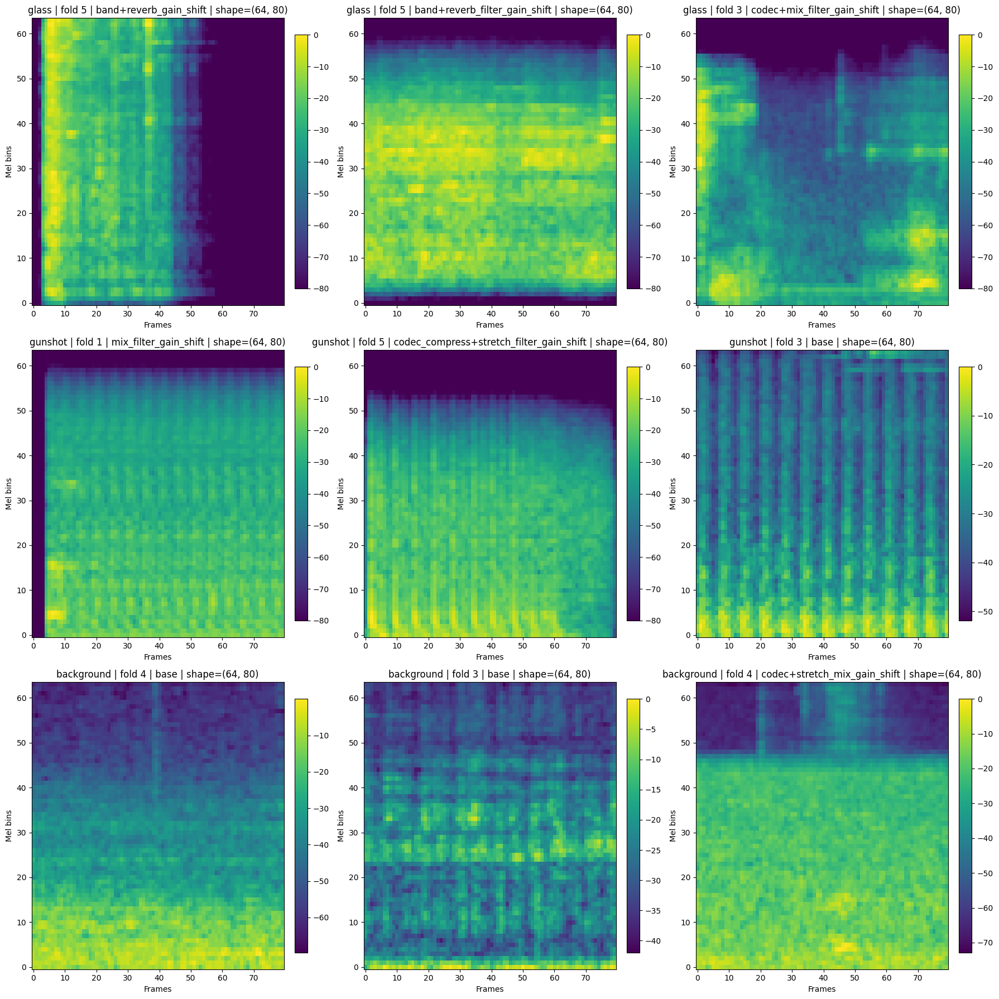

In [25]:
samples_per_label = 3
labels = ['glass', 'gunshot', BACKGROUND_LABEL]
rows = []
rng = np.random.default_rng(SEED)

for lbl in labels:
    subset = all_windows_df[all_windows_df['target_label'] == lbl]
    if subset.empty:
        continue
    # 有放回抽样，确保凑够 samples_per_label
    picks = subset.sample(n=samples_per_label, replace=len(subset) < samples_per_label, random_state=None)
    rows.extend(picks.to_dict('records'))

if not rows:
    print("No samples available for plotting.")
else:
    fig, axes = plt.subplots(3, 3, figsize=(18, 18))
    axes = axes.flatten()
    for idx, row in enumerate(rows[:9]):  # 防止不足 9 条
        y, sr = resolve_audio_from_row(row, sr=TARGET_SR)
        mel = log_mel_spectrogram(y, sr)
        if TARGET_FRAMES is not None:
            if mel.shape[1] > TARGET_FRAMES:
                mel = mel[:, :TARGET_FRAMES]
            elif mel.shape[1] < TARGET_FRAMES:
                pad = TARGET_FRAMES - mel.shape[1]
                mel = np.pad(mel, ((0, 0), (0, pad)), mode="constant")
        ax = axes[idx]
        im = ax.imshow(mel, origin='lower', aspect='auto')
        ax.set_title(
            f"{row.get('target_label','?')} | fold {row.get('fold_id','?')} | {row.get('pipeline','base')} | shape={mel.shape}"
        )
        ax.set_xlabel('Frames')
        ax.set_ylabel('Mel bins')
        fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
    # 处理空格子
    for j in range(len(rows), 9):
        axes[j].axis('off')
    plt.tight_layout()
    plt.show()


## 缓存训练 window 的 mel-log 图谱，以及输出训练目录

In [26]:
# Cache mel features + export training index (API)

cache_dir = CACHE_MEL64
index_csv = PROJECT_ROOT / 'cache' / 'window_index.csv'

index_df = cache_windows_to_mel_index(
    all_windows_df,
    cache_dir=cache_dir,
    index_csv=index_csv,
    target_sr=TARGET_SR,
    target_frames=TARGET_FRAMES,
)

print(f"Saved {len(index_df)} windows to {cache_dir}")
print(f"Index CSV: {index_csv}")
display(index_df.head())

# Quick sanity: label_ids combos (parse CSV-friendly strings)
import ast

def _to_tuple(v):
    if isinstance(v, str):
        try:
            v = ast.literal_eval(v)
        except Exception:
            return tuple()
    if v is None:
        return tuple()
    return tuple(v)

unique_combos = sorted({_to_tuple(v) for v in index_df['label_ids'].tolist()})
print('Unique label_ids combos:', unique_combos)
print('Label counts:')
print(index_df['label'].value_counts().to_string())


Saved 5500 windows to /workspace/cache/mel64
Index CSV: /workspace/cache/window_index.csv


,path,target_label,label,labels,label_ids,fold_id,pipeline,clip_id,window_id,source,shape,orig_label,length_sec
0,cache/mel64/glass/fold1/glass_breaking-glass-2...,glass,glass,[glass],[0],1,base,glass_breaking-glass-2-86555,glass_breaking-glass-2-86555_w0,sound_extra,"(64, 80)",glass,1.0
1,cache/mel64/glass/fold1/glass_shattering-chand...,glass,glass,[glass],[0],1,base,glass_shattering-chandelier-38391,glass_shattering-chandelier-38391_w0,sound_extra,"(64, 80)",glass,1.0
2,cache/mel64/glass/fold1/glass_shattering-chand...,glass,glass,[glass],[0],1,base,glass_shattering-chandelier-38391,glass_shattering-chandelier-38391_w1,sound_extra,"(64, 80)",glass,1.0
3,cache/mel64/glass/fold1/glass_breaking-glass-8...,glass,glass,[glass],[0],1,base,glass_breaking-glass-88411,glass_breaking-glass-88411_w0,sound_extra,"(64, 80)",glass,1.0
4,cache/mel64/glass/fold1/glass_541601__matt_rat...,glass,glass,[glass],[0],1,base,glass_541601__matt_ratz__shattering-chandelier,glass_541601__matt_ratz__shattering-chandelier_w0,sound_extra,"(64, 80)",glass,1.0


Unique label_ids combos: [(), (0,), (1,)]
Label counts:
label
background    2500
glass         1500
gunshot       1500


In [ ]:
# Cell: Export mel visualizations (per-fold & per-label sampling, excluding background)
viz_dir = PROJECT_ROOT / "cache" / "mel64_viz"
viz_dir.mkdir(parents=True, exist_ok=True)

# 采样比例：1.0=100%全量；0.2=20%
VIZ_SAMPLE_RATIO = 0.2 

if index_df is None or index_df.empty:
    print("index_df is empty; skip mel visualization")
else:
    viz_df = index_df[index_df["label"] != BACKGROUND_LABEL].copy()
    if viz_df.empty:
        print("No non-background samples for visualization")
    else:
        total_saved = 0
        total_groups = viz_df.groupby(["label", "fold_id"]).ngroups
        print(f"Groups to process: {total_groups}")

        for (label, fold_id), grp in viz_df.groupby(["label", "fold_id"]):
            if grp.empty:
                continue
            n = int(len(grp) * VIZ_SAMPLE_RATIO)
            if VIZ_SAMPLE_RATIO > 0 and n < 1:
                n = 1
            n = min(n, len(grp))
            sample = grp.sample(n=n, random_state=SEED)

            out_dir = viz_dir / str(label) / f"fold{fold_id}"
            out_dir.mkdir(parents=True, exist_ok=True)

            print(f"[{label} | fold {fold_id}] {len(grp)} rows -> saving {n} mels...")
            saved = 0
            for _, row in sample.iterrows():
                mel_path = Path(row["path"])
                if not mel_path.is_absolute():
                    mel_path = PROJECT_ROOT / mel_path
                mel = np.load(mel_path)

                out_path = out_dir / f"{mel_path.stem}.png"
                fig, ax = plt.subplots(figsize=(4, 3))
                im = ax.imshow(mel, origin="lower", aspect="auto")
                ax.set_title(f"{label} | fold {fold_id}")
                ax.set_xlabel("Frames")
                ax.set_ylabel("Mel bins")
                fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
                fig.tight_layout()
                fig.savefig(out_path, dpi=120)
                plt.close(fig)
                saved += 1
                total_saved += 1

            print(f"  saved {saved} -> {out_dir}")

        print(f"Mel visualizations saved: {total_saved} images under {viz_dir}")


Groups to process: 10
[glass | fold 1] 275 rows -> saving 55 mels...
  saved 55 -> /workspace/cache/mel64_viz/glass/fold1
[glass | fold 2] 243 rows -> saving 48 mels...
  saved 48 -> /workspace/cache/mel64_viz/glass/fold2
[glass | fold 3] 499 rows -> saving 99 mels...
  saved 99 -> /workspace/cache/mel64_viz/glass/fold3
[glass | fold 4] 252 rows -> saving 50 mels...
  saved 50 -> /workspace/cache/mel64_viz/glass/fold4
[glass | fold 5] 231 rows -> saving 46 mels...
  saved 46 -> /workspace/cache/mel64_viz/glass/fold5
[gunshot | fold 1] 297 rows -> saving 59 mels...
  saved 59 -> /workspace/cache/mel64_viz/gunshot/fold1
[gunshot | fold 2] 295 rows -> saving 59 mels...
  saved 59 -> /workspace/cache/mel64_viz/gunshot/fold2
[gunshot | fold 3] 313 rows -> saving 62 mels...
  saved 62 -> /workspace/cache/mel64_viz/gunshot/fold3
[gunshot | fold 4] 300 rows -> saving 60 mels...


## Regression Summary / 回归自检
这个单元不加载音频，只汇总关键表的规模/分布，方便每次改动后快速确认没有跑偏。


In [ ]:
from collections import OrderedDict
import ast

def _maybe(name):
    return globals().get(name)

def _df_info(df, name):
    if df is None:
        return
    print(f"\n[{name}] rows={len(df)} cols={list(df.columns)}")

resampled_df = _maybe('resampled_df')
folded_df = _maybe('folded_df')
window_df = _maybe('window_df')
aug_df = _maybe('aug_df')
bg_df = _maybe('bg_df')
all_windows_df = _maybe('all_windows_df')
index_df = _maybe('index_df')

for name, df in [
    ('resampled_df', resampled_df),
    ('folded_df', folded_df),
    ('window_df', window_df),
    ('aug_df', aug_df),
    ('bg_df', bg_df),
    ('all_windows_df', all_windows_df),
    ('index_df', index_df),
]:
    _df_info(df, name)

if folded_df is not None and 'fold_id' in folded_df.columns and 'target_label' in folded_df.columns:
    print('\nFold x target_label (clip-level counts):')
    pivot = folded_df.pivot_table(index='target_label', columns='fold_id', values='filepath', aggfunc='count').fillna(0).astype(int)
    print(pivot.to_string())

if all_windows_df is not None and 'fold_id' in all_windows_df.columns and 'target_label' in all_windows_df.columns:
    print('\nFold x target_label (window-level counts):')
    pivot = all_windows_df.pivot_table(index='target_label', columns='fold_id', values='window_id', aggfunc='count').fillna(0).astype(int)
    print(pivot.to_string())

if index_df is not None and 'path' in index_df.columns:
    # Inspect mel shape quickly by sampling one npy
    try:
        sample_path = Path(index_df['path'].iloc[0])
        if not sample_path.is_absolute():
            sample_path = PROJECT_ROOT / sample_path
        mel = np.load(sample_path)
        print(f"\nSample mel: {sample_path} shape={mel.shape} dtype={mel.dtype}")
    except Exception as e:
        print('\nSample mel check failed:', e)

    # label_ids combos
    if 'label_ids' in index_df.columns:
        def _parse_ids(v):
            if isinstance(v, str):
                try:
                    v = ast.literal_eval(v)
                except Exception:
                    return tuple()
            if v is None:
                return tuple()
            return tuple(v)
        combos = sorted({_parse_ids(v) for v in index_df['label_ids'].tolist()})
        print('\nUnique label_ids combos:', combos)


In [ ]:
# # Glass coverage + optional rebalance (clip-level move to balance folds)
# import pandas as pd
# from pathlib import Path
# from src.folds import rebalance_folds_by_windows

# REBALANCE_GLASS = True  # set False to only report
# TOL_RATIO = 0.05

# clips = folded_df[folded_df['canonical_label']=='glass'] if 'folded_df' in globals() else pd.DataFrame()
# print(f"Glass clips in folded_df: {len(clips)}")
# clip_ids = set(Path(str(p)).stem for p in clips['filepath']) if not clips.empty else set()
# print(f"Unique glass clip_id stems: {len(clip_ids)}")

# if 'window_df' not in globals():
#     print('window_df not found; skip rebalance')
# else:
#     glass_win = window_df[window_df['target_label']=='glass']
#     print(f"Glass windows in window_df: {len(glass_win)}")
#     print("Before rebalance (per fold):")
#     print(glass_win.groupby('fold_id').size())

#     if REBALANCE_GLASS:
#         glass_balanced, moves = rebalance_folds_by_windows(
#             glass_win,
#             label_col='target_label',
#             preserve_label_presence=True,
#             tolerance_ratio=TOL_RATIO,
#         )
#         if moves:
#             print(f"Rebalanced glass (moved {len(moves)} clips):")
#             for m in moves:
#                 print(f"clip {m['clip_id']} : fold {m['from']} -> {m['to']} | windows={m['n_windows']}")
#             move_map = {m['clip_id']: m['to'] for m in moves}
#             window_df.loc[window_df['target_label']=='glass', 'fold_id'] = window_df.apply(
#                 lambda r: move_map.get(r['clip_id'], r['fold_id']), axis=1
#             )
#             if 'folded_df' in globals():
#                 folded_df.loc[folded_df['canonical_label']=='glass', 'fold_id'] = folded_df.apply(
#                     lambda r: move_map.get(Path(str(r['filepath'])).stem, r['fold_id']), axis=1
#                 )
#             print("After rebalance (per fold):")
#             print(window_df[window_df['target_label']=='glass'].groupby('fold_id').size())
#         else:
#             print("No glass rebalance performed (within tolerance).")
